<a href="https://colab.research.google.com/github/njocimar28/nba/blob/main/Analisando_temporada_2022_23_NBA_por_clubes_(spark).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Análise temporada 2022-23 NBA por times

## Ajustando os dados

### Importando bibliotecas

In [78]:
!pip install pyspark

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [193]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import urllib.request
from PIL import Image
import numpy as np
import requests
from pyspark.sql import SparkSession
from pyspark.sql.functions import sum, col, expr, round, monotonically_increasing_id
from io import BytesIO
from pyspark.sql import functions as F
from pyspark.sql.types import FloatType

### Importando os dados

In [80]:
# Criando um sessão Spark
spark = SparkSession.builder \
    .appName("nba_2023") \
    .getOrCreate()

In [81]:
# URL do arquivo CSV
url_nba = "https://github.com/njocimar28/nba/blob/84fe6c9d6cb5fdb3d5194e191e767927d5fd235e/jogadores_em_atividade_nba%20(1)?raw=true"

# Faz o download do arquivo 
response_nba = requests.get(url_nba)
file_content_nba = response_nba.content

# Salva o conteúdo em um arquivo local
with open("nba.csv", "wb") as file:
    file.write(file_content_nba)

# Carrega o arquivo CSV no Spark
nba = spark.read.format("csv").option("header", "true").load("nba.csv")

In [153]:
nba.show()

+---------+---------+---------+----------+-----------------+----------+---+---+------+---+----+------+----+----+-------+---+---+------+----+----+---+---+---+---+---+---+----+----------------+
|PLAYER_ID|SEASON_ID|LEAGUE_ID|   TEAM_ID|TEAM_ABBREVIATION|PLAYER_AGE| GP| GS|   MIN|FGM| FGA|FG_PCT|FG3M|FG3A|FG3_PCT|FTM|FTA|FT_PCT|OREB|DREB|REB|AST|STL|BLK|TOV| PF| PTS|         JOGADOR|
+---------+---------+---------+----------+-----------------+----------+---+---+------+---+----+------+----+----+-------+---+---+------+----+----+---+---+---+---+---+---+----+----------------+
|  1630173|  2020-21|       00|1610612748|              MIA|      21.0| 61|  4| 737.0|124| 228| 0.544|   0|   1|    0.0| 56|110| 0.509|  73| 135|208| 29| 20| 28| 43| 91| 304|Precious Achiuwa|
|  1630173|  2021-22|       00|1610612761|              TOR|      22.0| 73| 28|1725.0|265| 603| 0.439|  56| 156|  0.359| 78|131| 0.595| 146| 327|473| 82| 37| 41| 84|151| 664|Precious Achiuwa|
|  1630173|  2022-23|       00|161061276

In [152]:
# URL do arquivo classificação
url_classificacao = "https://github.com/njocimar28/nba/blob/bcc58bcfb72df9d00a3e5e12f9b8dc22cb3c4eac/classificacao_2023.csv?raw=true"

# Faz o download do arquivo  classificação
response_classificacao = requests.get(url_classificacao)
file_content_classificacao = response_classificacao.content

# Salva o conteúdo em um arquivo local
with open("classificacao.csv", "wb") as file:
    file.write(file_content_classificacao)

# Carrega o arquivo CSV no Spark
classificacao = spark.read.format("csv").option("header", "true").load("classificacao.csv")

In [84]:
classificacao.show(30)

+--------------------+----------+-----+---+---+------+-----------+------+------+-----------+------+-----+----------+-----------+
|                Time|ABREVIAÇÃO|jogos|  V|  D|V_CASA|V_VISITANTE|V_CONF|D_CASA|D_VISITANTE|D_CONF|  PTS|PTS CONTRA|CONFERÊNCIA|
+--------------------+----------+-----+---+---+------+-----------+------+------+-----------+------+-----+----------+-----------+
|     Milwaukee Bucks|       MIL|   82| 58| 24|    32|         26|    35|     9|         15|    17|116.9|     113.3|      LESTE|
|      Boston Celtics|       BOS|   82| 57| 25|    32|         25|    34|     9|         16|    18|117.9|     111.4|      LESTE|
|  Philadelphia 76ers|       PHI|   82| 54| 28|    29|         25|    34|    12|         16|    18|115.2|     110.9|      LESTE|
| Cleveland Cavaliers|       CLE|   82| 51| 31|    31|         20|    34|    10|         21|    18|112.3|     106.9|      LESTE|
|     New York Knicks|       NYK|   82| 47| 35|    23|         24|    32|    18|         17|    2

### Analisando e transformando os dados

In [85]:
nba.printSchema()

root
 |-- PLAYER_ID: string (nullable = true)
 |-- SEASON_ID: string (nullable = true)
 |-- LEAGUE_ID: string (nullable = true)
 |-- TEAM_ID: string (nullable = true)
 |-- TEAM_ABBREVIATION: string (nullable = true)
 |-- PLAYER_AGE: string (nullable = true)
 |-- GP: string (nullable = true)
 |-- GS: string (nullable = true)
 |-- MIN: string (nullable = true)
 |-- FGM: string (nullable = true)
 |-- FGA: string (nullable = true)
 |-- FG_PCT: string (nullable = true)
 |-- FG3M: string (nullable = true)
 |-- FG3A: string (nullable = true)
 |-- FG3_PCT: string (nullable = true)
 |-- FTM: string (nullable = true)
 |-- FTA: string (nullable = true)
 |-- FT_PCT: string (nullable = true)
 |-- OREB: string (nullable = true)
 |-- DREB: string (nullable = true)
 |-- REB: string (nullable = true)
 |-- AST: string (nullable = true)
 |-- STL: string (nullable = true)
 |-- BLK: string (nullable = true)
 |-- TOV: string (nullable = true)
 |-- PF: string (nullable = true)
 |-- PTS: string (nullable = tr

In [86]:
classificacao.printSchema()

root
 |-- Time: string (nullable = true)
 |-- ABREVIAÇÃO: string (nullable = true)
 |-- jogos: string (nullable = true)
 |-- V: string (nullable = true)
 |-- D: string (nullable = true)
 |-- V_CASA: string (nullable = true)
 |-- V_VISITANTE: string (nullable = true)
 |-- V_CONF: string (nullable = true)
 |-- D_CASA: string (nullable = true)
 |-- D_VISITANTE: string (nullable = true)
 |-- D_CONF: string (nullable = true)
 |-- PTS: string (nullable = true)
 |-- PTS CONTRA: string (nullable = true)
 |-- CONFERÊNCIA: string (nullable = true)



In [87]:
# filtrando pela temporada 2022-23
temporada_2023 = nba.filter(col("SEASON_ID") == "2022-23")

In [154]:
# Criando média das estatiticas por time
nba_por_time = temporada_2023.groupby("TEAM_ABBREVIATION").agg(
    round((sum("AST") / 82), 1).alias("AST"),
    round((sum("REB") / 82), 1).alias("REB"),
    round((sum("OREB") / 82), 1).alias("OREB"),
    round((sum("DREB") / 82), 1).alias("DREB"),
    round((sum("BLK") / 82), 1).alias("BLK"),
    round((sum("STL") / 82), 1).alias("STL"),
    round((sum("TOV") / 82), 1).alias("TOV"),
    round((sum("FTM") / 82), 1).alias("FTM"),
    round((sum("FTA") / 82), 1).alias("FTA"),
    round((sum("FGA") / 82), 1).alias("FGA"),
    round((sum("FGM") / 82), 1).alias("FGM"),
    round((sum("FG3A") / 82), 1).alias("FG3A"),
    round((sum("FG3M") / 82), 1).alias("FG3M"),
    round((sum("PF") / 82), 1).alias("PF")
)

#Excluindo os dados do time "TOT" que representa a soma dos dados dos jogadores que trocaram de time durante a temporada
nba_por_time = nba_por_time.filter(col("TEAM_ABBREVIATION") != "TOT")

nba_por_time.show(30)

+-----------------+----+----+----+----+---+---+----+----+----+----+----+----+----+----+
|TEAM_ABBREVIATION| AST| REB|OREB|DREB|BLK|STL| TOV| FTM| FTA| FGA| FGM|FG3A|FG3M|  PF|
+-----------------+----+----+----+----+---+---+----+----+----+----+----+----+----+----+
|              GSW|25.2|41.5|10.0|31.5|3.6|6.3|12.6|11.6|15.1|74.2|36.2|35.3|14.0|18.6|
|              DET|15.9|37.8|10.6|27.2|3.3|5.3|11.7|16.8|22.0|71.5|33.4|26.0| 9.2|18.2|
|              LAL|17.4|33.3| 7.5|25.8|3.6|4.4| 9.8|13.6|18.2|65.0|31.3|21.6| 7.2|12.1|
|              NYK|13.9|34.3|10.4|23.9|3.7|5.1| 7.7|10.5|14.2|57.3|26.8|24.0| 8.4|15.6|
|              LAC|20.7|34.7| 7.5|27.2|3.5|6.0|12.0|16.6|20.8|75.8|36.3|28.1|10.7|15.5|
|              UTA|16.6|39.1|10.0|29.1|4.7|4.7|10.4|13.2|17.0|65.7|31.4|27.6| 9.7|15.8|
|              BOS|25.8|42.8| 9.3|33.6|5.0|6.0|12.4|17.4|21.4|83.9|40.0|38.5|14.3|17.6|
|              TOR|17.5|29.8| 8.7|21.0|3.5|7.8| 8.4|12.8|15.9|69.3|30.9|27.6| 9.4|14.2|
|              SAS|20.3|28.7| 7.

In [237]:
# Criando as colunas de porcentagem de Arremessos 

nba_por_time = nba_por_time.withColumn(
    'FT_PCT', F.col('FTM') / F.col('FTA')*100
    ).withColumn(
        'FG_PCT', F.col('FGM') / F.col('FGA')*100
    ).withColumn(
        'FG3_PCT', F.col('FG3M') / F.col('FG3A')*100
)

In [238]:
# Renomear a coluna "abreviação" para "TEAM_ABBREVIATION" no DataFrame classificacao
classificacao = classificacao.withColumnRenamed("abreviação", "TEAM_ABBREVIATION")

# Realizar o join entre os DataFrames nba_por_time e classificacao e organizar pelo número de vitórias
dados_por_time_2023 = classificacao.join(nba_por_time, "TEAM_ABBREVIATION", "inner").orderBy(col("V").desc())

dados_por_time_2023.show(30)

+-----------------+--------------------+-----+---+---+------+-----------+------+------+-----------+------+-----+----------+-----------+----+----+----+----+---+---+----+----+----+----+----+----+----+----+-----------------+------------------+------------------+
|TEAM_ABBREVIATION|                Time|jogos|  V|  D|V_CASA|V_VISITANTE|V_CONF|D_CASA|D_VISITANTE|D_CONF|  PTS|PTS CONTRA|CONFERÊNCIA| AST| REB|OREB|DREB|BLK|STL| TOV| FTM| FTA| FGA| FGM|FG3A|FG3M|  PF|           FT_PCT|            FG_PCT|           FG3_PCT|
+-----------------+--------------------+-----+---+---+------+-----------+------+------+-----------+------+-----+----------+-----------+----+----+----+----+---+---+----+----+----+----+----+----+----+----+-----------------+------------------+------------------+
|              MIL|     Milwaukee Bucks|   82| 58| 24|    32|         26|    35|     9|         15|    17|116.9|     113.3|      LESTE|24.9|45.2|10.5|34.6|4.8|5.9|13.5|16.3|21.9|85.2|40.7|36.4|13.5|17.2|74.42922374429224

In [192]:
dados_por_time_2023.printSchema()

root
 |-- TEAM_ABBREVIATION: string (nullable = true)
 |-- Time: string (nullable = true)
 |-- jogos: string (nullable = true)
 |-- V: string (nullable = true)
 |-- D: string (nullable = true)
 |-- V_CASA: string (nullable = true)
 |-- V_VISITANTE: string (nullable = true)
 |-- V_CONF: string (nullable = true)
 |-- D_CASA: string (nullable = true)
 |-- D_VISITANTE: string (nullable = true)
 |-- D_CONF: string (nullable = true)
 |-- PTS: string (nullable = true)
 |-- PTS CONTRA: string (nullable = true)
 |-- CONFERÊNCIA: string (nullable = true)
 |-- AST: double (nullable = true)
 |-- REB: double (nullable = true)
 |-- OREB: double (nullable = true)
 |-- DREB: double (nullable = true)
 |-- BLK: double (nullable = true)
 |-- STL: double (nullable = true)
 |-- TOV: double (nullable = true)
 |-- FTM: double (nullable = true)
 |-- FTA: double (nullable = true)
 |-- FGA: double (nullable = true)
 |-- FGM: double (nullable = true)
 |-- FG3A: double (nullable = true)
 |-- FG3M: double (nullabl

In [195]:
# Lista de colunas a serem convertidas
colunas_para_converter_int = ["jogos", "V", "D", "V_CASA", "V_VISITANTE", "V_CONF", "D_CASA", "D_VISITANTE", "D_CONF"]

# Convertendo as colunas para inteiro
for coluna in colunas_para_converter_int:
    dados_por_time_2023 = dados_por_time_2023.withColumn(coluna, col(coluna).cast("integer"))

In [239]:
# Lista de colunas a serem convertidas
colunas_para_converter_float = ["FT_PCT", "FG_PCT", "FG3_PCT"]

# Convertendo as colunas para float
for coluna in colunas_para_converter_float:
    dados_por_time_2023 = dados_por_time_2023.withColumn(coluna, col(coluna).cast(FloatType()))

In [240]:
nba_por_time = nba_por_time.withColumn("FT_PCT", round(nba_por_time["FT_PCT"], 2))
nba_por_time = nba_por_time.withColumn("FG_PCT", round(nba_por_time["FG_PCT"], 2))
nba_por_time = nba_por_time.withColumn("FG3_PCT", round(nba_por_time["FG3_PCT"], 2))

In [196]:
dados_por_time_2023.printSchema()

root
 |-- TEAM_ABBREVIATION: string (nullable = true)
 |-- Time: string (nullable = true)
 |-- jogos: integer (nullable = true)
 |-- V: integer (nullable = true)
 |-- D: integer (nullable = true)
 |-- V_CASA: integer (nullable = true)
 |-- V_VISITANTE: integer (nullable = true)
 |-- V_CONF: integer (nullable = true)
 |-- D_CASA: integer (nullable = true)
 |-- D_VISITANTE: integer (nullable = true)
 |-- D_CONF: integer (nullable = true)
 |-- PTS: string (nullable = true)
 |-- PTS CONTRA: string (nullable = true)
 |-- CONFERÊNCIA: string (nullable = true)
 |-- AST: double (nullable = true)
 |-- REB: double (nullable = true)
 |-- OREB: double (nullable = true)
 |-- DREB: double (nullable = true)
 |-- BLK: double (nullable = true)
 |-- STL: double (nullable = true)
 |-- TOV: double (nullable = true)
 |-- FTM: double (nullable = true)
 |-- FTA: double (nullable = true)
 |-- FGA: double (nullable = true)
 |-- FGM: double (nullable = true)
 |-- FG3A: double (nullable = true)
 |-- FG3M: double

### Criando lista / dicionários úteis

In [93]:
# Dicionário com o link dos logos dos times
times_nba = {
    'Atlanta Hawks': 'https://www.thesportsdb.com/images/media/team/badge/q3bx641635067495.png/preview',
    'Boston Celtics': 'https://www.thesportsdb.com/images/media/team/badge/4j85bn1667936589.png/preview',
    'Brooklyn Nets': 'https://www.thesportsdb.com/images/media/team/badge/n06q811667936857.png/preview',
    'Charlotte Hornets': 'https://www.thesportsdb.com/images/media/team/badge/xqtvvp1422380623.png/preview',
    'Chicago Bulls': 'https://www.thesportsdb.com/images/media/team/badge/yk7swg1547214677.png/preview',
    'Cleveland Cavaliers': 'https://www.thesportsdb.com/images/media/team/badge/tys75k1664478652.png/preview',
    'Dallas Mavericks': 'https://www.thesportsdb.com/images/media/team/badge/yqrxrs1420568796.png/preview',
    'Denver Nuggets': 'https://www.thesportsdb.com/images/media/team/badge/8o8j5k1546016274.png/preview',
    'Detroit Pistons': 'https://www.thesportsdb.com/images/media/team/badge/lg7qrc1621594751.png/preview',
    'Golden State Warriors': 'https://www.thesportsdb.com/images/media/team/badge/irobi61565197527.png/preview',
    'Houston Rockets': 'https://www.thesportsdb.com/images/media/team/badge/yezpho1597486052.png/preview',
    'Indiana Pacers': 'https://www.thesportsdb.com/images/media/team/badge/v6jzgm1503741821.png/preview',
    'Los Angeles Clippers': 'https://www.thesportsdb.com/images/media/team/badge/htj1sg1664478859.png/preview',
    'Los Angeles Lakers': 'https://www.thesportsdb.com/images/media/team/badge/spa6c11621594682.png/preview',
    'Memphis Grizzlies': 'https://www.thesportsdb.com/images/media/team/badge/m64v461565196789.png/preview',
    'Miami Heat': 'https://www.thesportsdb.com/images/media/team/badge/5v67x51547214763.png/preview',
    'Milwaukee Bucks': 'https://www.thesportsdb.com/images/media/team/badge/olhug01621594702.png/preview',
    'Minnesota Timberwolves': 'https://www.thesportsdb.com/images/media/team/badge/5xpgjg1621594771.png/preview',
    'New Orleans Pelicans': 'https://www.thesportsdb.com/images/media/team/badge/f341s31523700397.png/preview',
    'New York Knicks': 'https://www.thesportsdb.com/images/media/team/badge/wyhpuf1511810435.png/preview',
    'Oklahoma City Thunder': 'https://www.thesportsdb.com/images/media/team/badge/xpswpq1422575434.png/preview',
    'Orlando Magic': 'https://www.thesportsdb.com/images/media/team/badge/txuyrr1422492990.png/preview',
    'Philadelphia 76ers': 'https://www.thesportsdb.com/images/media/team/badge/71545f1518464849.png/preview',
    'Phoenix Suns': 'https://www.thesportsdb.com/images/media/team/badge/qrtuxq1422919040.png/preview',
    'Portland Trail Blazers': 'https://www.thesportsdb.com/images/media/team/badge/mbtzin1520794112.png/preview',
    'Sacramento Kings': 'https://www.thesportsdb.com/images/media/team/badge/5d3dpz1611859587.png/preview',
    'San Antonio Spurs': 'https://www.thesportsdb.com/images/media/team/badge/obucan1611859537.png/preview',
    'Toronto Raptors': 'https://www.thesportsdb.com/images/media/team/badge/ax36vz1635070057.png/preview',
    'Utah Jazz': 'https://www.thesportsdb.com/images/media/team/badge/ne4a051664478964.png/preview',
    'Washington Wizards': 'https://www.thesportsdb.com/images/media/team/badge/rhxi9w1621594729.png/preview'
}

In [94]:
# Lista com o nome dos times
lista_times_nba = [
    'Atlanta Hawks',
    'Boston Celtics',
    'Brooklyn Nets',
    'Charlotte Hornets',
    'Chicago Bulls',
    'Cleveland Cavaliers',
    'Dallas Mavericks',
    'Denver Nuggets',
    'Detroit Pistons',
    'Golden State Warriors',
    'Houston Rockets',
    'Indiana Pacers',
    'Los Angeles Clippers',
    'Los Angeles Lakers',
    'Memphis Grizzlies',
    'Miami Heat',
    'Milwaukee Bucks',
    'Minnesota Timberwolves',
    'New Orleans Pelicans',
    'New York Knicks',
    'Oklahoma City Thunder',
    'Orlando Magic',
    'Philadelphia 76ers',
    'Phoenix Suns',
    'Portland Trail Blazers',
    'Sacramento Kings',
    'San Antonio Spurs',
    'Toronto Raptors',
    'Utah Jazz',
    'Washington Wizards'
]

### Criando funções para demonstrar o desempenho dos times

In [260]:
# Função que cria um DF com as estatísticas dos times e plota seu logotipo

def mostrar_estatisticas(time):
   # Obter a imagem a partir do URL
    url_imagem = times_nba.get(time)
    response = requests.get(url_imagem)
    imagem = Image.open(BytesIO(response.content))

    # Criar uma nova imagem com fundo preto
    fundo_preto = Image.new('RGB', (250, 250), 'black')

    # Colar a imagem do logotipo sobre o fundo preto
    fundo_preto.paste(imagem, (0, 0), imagem)

    # Exibir a imagem com fundo preto
    plt.imshow(fundo_preto)
    plt.axis('off')  # Desativar os eixos
    plt.show()

    # Filtrar o DataFrame pelo time especificado
    estatisticas = dados_por_time_2023.filter(dados_por_time_2023['Time'] == time)

    # Selecionar as principais estatísticas
    estatisticas = estatisticas.select('Time', 'V', 'PTS', 'AST', 'REB', 'BLK', 'STL')

    # Renomear a coluna 'V' para 'Vitórias'
    estatisticas = estatisticas.withColumnRenamed(
        'V', 'Vitórias').withColumnRenamed(
            'PTS', 'Pontos').withColumnRenamed(
            'AST', 'Assistências').withColumnRenamed(
            'REB', 'Rebotes').withColumnRenamed(
            'BLK', 'Tocos').withColumnRenamed(
            'STL', 'Roubos de bola')

    # Exibir as estatísticas
    estatisticas.show()

In [257]:
# Função que gráfico de barras com os logos dos times

def plotar_grafico_com_logos(dataframe, atributo, titulo):
    # Converter o DataFrame Spark para um DataFrame do Pandas
    pandas_data = dataframe.toPandas()

    # Converter a coluna do atributo para tipo numérico
    pandas_data[atributo] = pandas_data[atributo].astype(float)

    # Criar uma figura e os eixos do gráfico
    fig, ax = plt.subplots(figsize=(12, 3))

    # Definir a posição inicial do primeiro time
    posicao_x = np.arange(len(pandas_data))

    # Percorrer os times selecionados
    for i, row in pandas_data.iterrows():
        time = row['Time']
        if time in times_nba:
            # Abrir a imagem a partir do URL
            with urllib.request.urlopen(times_nba[time]) as url:
                img = Image.open(url)
                img = img.convert('RGB')

            # Plotar a imagem
            ax.imshow(img, extent=[posicao_x[i], posicao_x[i] + 0.8, 0, row[atributo]], aspect='auto')

            # Adicionar o valor do dado acima da imagem
            ax.text(posicao_x[i] + 0.4, row[atributo] + 0.1, str(row[atributo]), ha='center', va='bottom')

    # Configurar os limites do eixo X e Y
    ax.set_xlim(0, len(pandas_data))
    ax.set_ylim(0, max(pandas_data[atributo]) * 1.1)

    # Configurar os rótulos do eixo X
    ax.set_xticks(posicao_x + 0.4)
    ax.set_xticklabels(pandas_data['Time'], rotation=45)

    # Configurar os rótulos dos eixos
    ax.set_ylabel(f'{atributo}')

    # Adicionar título ao gráfico
    plt.title(titulo)

    # Mostrar o gráfico
    plt.show()

In [261]:
# Função que cria um gráfico de barras horizontais com o logo dos times

def plotar_grafico_barras_horizontais(dataframe, atributo, conferencia, titulo):
    # Filtrar os dados pela conferência selecionada
    df_conferencia = dataframe[dataframe['CONFERÊNCIA'] == conferencia]

    # Converter o DataFrame Spark para um DataFrame do Pandas
    pandas_data = df_conferencia.toPandas()

    # Converter a coluna do atributo para tipo numérico
    pandas_data[atributo] = pandas_data[atributo].astype(float)

    # Criar uma figura e os eixos do gráfico
    fig, ax = plt.subplots(figsize=(1, 8))

    # Definir a posição inicial dos times
    posicao_y = np.arange(len(pandas_data))

    # Percorrer os times selecionados
    for i, row in pandas_data.iterrows():
        time = row['Time']
        if time in times_nba:
            # Abrir a imagem a partir do URL
            with urllib.request.urlopen(times_nba[time]) as url:
                img = Image.open(url)
                img = img.convert('RGB')

            # Plotar a imagem
            ax.imshow(img, extent=[0, row[atributo], posicao_y[i], posicao_y[i] + 0.8], aspect='auto')

            # Adicionar o valor do dado à direita da imagem com deslocamento
            ax.text(row[atributo] + 0.2, posicao_y[i] + 0.4, str(row[atributo]), ha='left', va='center', color='black',
                    bbox=dict(facecolor='white', edgecolor='none', boxstyle='round'))

    # Configurar os limites do eixo X e Y
    ax.set_xlim(0, max(pandas_data[atributo]) * 1.1)
    ax.set_ylim(0, len(pandas_data))

    # Configurar os rótulos do eixo Y
    ax.set_yticks(posicao_y + 0.4)
    ax.set_yticklabels(pandas_data['Time'])

    # Configurar os rótulos dos eixos
    ax.set_xlabel(f'{atributo}')
    ax.set_ylabel('Time')

    # Adicionar título ao gráfico
    plt.title(titulo)

    # Mostrar o gráfico
    plt.show()

In [258]:
# Função ajustada para plotar o top 5 dos times por arremessos

def plotar_grafico_arremessos(dataframe, atributo, titulo):
     # Limitar exibição para 5 elementos
    df_conferencia = dataframe.limit(5)

    # Converter o DataFrame Spark para um DataFrame do Pandas
    pandas_data = df_conferencia.toPandas()

    # Converter a coluna do atributo para tipo numérico
    pandas_data[atributo] = pandas_data[atributo].astype(float).round(2)

    # Criar uma figura e os eixos do gráfico
    fig, ax = plt.subplots(figsize=(1, 6))

    # Definir a posição inicial dos times
    posicao_y = np.arange(len(pandas_data))

    # Percorrer os times selecionados
    for i, row in pandas_data.iterrows():
        time = row['Time']
        if time in times_nba:
            # Abrir a imagem a partir do URL
            with urllib.request.urlopen(times_nba[time]) as url:
                img = Image.open(url)
                img = img.convert('RGB')

            # Plotar a imagem
            ax.imshow(img, extent=[0, row[atributo], posicao_y[i], posicao_y[i] + 0.8], aspect='auto')

            # Adicionar o valor do dado à direita da imagem com deslocamento
            ax.text(row[atributo] + 0.2, posicao_y[i] + 0.4, str(row[atributo]), ha='left', va='center', color='black',
                    bbox=dict(facecolor='white', edgecolor='none', boxstyle='round'))

    # Configurar os limites do eixo X e Y
    ax.set_xlim(0, max(pandas_data[atributo]) * 1.1)
    ax.set_ylim(0, len(pandas_data))

    # Configurar os rótulos do eixo Y
    ax.set_yticks(posicao_y + 0.4)
    ax.set_yticklabels(pandas_data['Time'])

    # Configurar os rótulos dos eixos
    ax.set_xlabel(f'{atributo}')
    ax.set_ylabel('Time')

    # Adicionar título ao gráfico
    plt.title(titulo)

    # Mostrar o gráfico
    plt.show()

## Classificação temporada 2023

### Classificação Geral

In [98]:
# Filtrando os dados pela conferência Leste
classificacão_geral = dados_por_time_2023[['Time','V','D']]

# Criar coluna classificação
classificacão_geral = classificacão_geral.withColumn('Classificação', monotonically_increasing_id() + 1)

# Reordenando as colunas
classificacão_geral = classificacão_geral.select('Classificação', 'Time', 'V', 'D')

classificacão_geral.show(30)

+-------------+--------------------+---+---+
|Classificação|                Time|  V|  D|
+-------------+--------------------+---+---+
|            1|     Milwaukee Bucks| 58| 24|
|            2|      Boston Celtics| 57| 25|
|            3|  Philadelphia 76ers| 54| 28|
|            4|      Denver Nuggets| 53| 29|
|            5| Cleveland Cavaliers| 51| 31|
|            6|   Memphis Grizzlies| 51| 31|
|            7|    Sacramento Kings| 48| 34|
|            8|     New York Knicks| 47| 35|
|            9|        Phoenix Suns| 45| 37|
|           10|       Brooklyn Nets| 45| 37|
|           11|Golden State Warr...| 44| 38|
|           12|Los Angeles Clippers| 44| 38|
|           13|          Miami Heat| 44| 38|
|           14|  Los Angeles Lakers| 43| 39|
|           15|Minnesota Timberw...| 42| 40|
|           16|New Orleans Pelicans| 42| 40|
|           17|     Toronto Raptors| 41| 41|
|           18|       Atlanta Hawks| 41| 41|
|           19|Oklahoma City Thu...| 40| 42|
|         

### Classificação conferência Leste

In [99]:
# Filtrando os dados pela conferência Leste
classificacao_leste = classificacão_geral.filter(col("CONFERÊNCIA") == "LESTE")
classificacao_leste = classificacao_leste.withColumn('Classificação', monotonically_increasing_id() + 1)
classificacao_leste.show(15)

+-------------+-------------------+---+---+
|Classificação|               Time|  V|  D|
+-------------+-------------------+---+---+
|            1|    Milwaukee Bucks| 58| 24|
|            2|     Boston Celtics| 57| 25|
|            3| Philadelphia 76ers| 54| 28|
|            4|Cleveland Cavaliers| 51| 31|
|            5|    New York Knicks| 47| 35|
|            6|      Brooklyn Nets| 45| 37|
|            7|         Miami Heat| 44| 38|
|            8|    Toronto Raptors| 41| 41|
|            9|      Atlanta Hawks| 41| 41|
|           10|      Chicago Bulls| 40| 42|
|           11| Washington Wizards| 35| 47|
|           12|     Indiana Pacers| 35| 47|
|           13|      Orlando Magic| 34| 48|
|           14|  Charlotte Hornets| 27| 55|
|           15|    Detroit Pistons| 17| 65|
+-------------+-------------------+---+---+



### Classificação conferência Oeste

In [100]:
# Filtrando os dados pela conferência Oeste
classificacao_oeste = classificacão_geral.filter(col("CONFERÊNCIA") == "OESTE")
classificacao_oeste = classificacao_oeste.withColumn('Classificação', monotonically_increasing_id() + 1)
classificacao_oeste.show(15)

+-------------+--------------------+---+---+
|Classificação|                Time|  V|  D|
+-------------+--------------------+---+---+
|            1|      Denver Nuggets| 53| 29|
|            2|   Memphis Grizzlies| 51| 31|
|            3|    Sacramento Kings| 48| 34|
|            4|        Phoenix Suns| 45| 37|
|            5|Golden State Warr...| 44| 38|
|            6|Los Angeles Clippers| 44| 38|
|            7|  Los Angeles Lakers| 43| 39|
|            8|Minnesota Timberw...| 42| 40|
|            9|New Orleans Pelicans| 42| 40|
|           10|Oklahoma City Thu...| 40| 42|
|           11|    Dallas Mavericks| 38| 44|
|           12|           Utah Jazz| 37| 45|
|           13|Portland Trail Bl...| 33| 49|
|           14|   San Antonio Spurs| 22| 60|
|           15|     Houston Rockets| 22| 60|
+-------------+--------------------+---+---+



## Criando Ranking para analisar o desempenho (Geral)

### Vitórias

In [101]:
# Classificar o DataFrame por pontos em ordem decrescente (os melhores)
top_5_vitorias = dados_por_time_2023[[
    'Time','V','V_CASA','V_VISITANTE','V_CONF','CONFERÊNCIA'
    ]].sort("V", ascending=False).limit(5)
top_5_vitorias = top_5_vitorias.withColumnRenamed("V", "Vitórias")

top_5_vitorias.show()

+-------------------+--------+------+-----------+------+-----------+
|               Time|Vitórias|V_CASA|V_VISITANTE|V_CONF|CONFERÊNCIA|
+-------------------+--------+------+-----------+------+-----------+
|    Milwaukee Bucks|      58|    32|         26|    35|      LESTE|
|     Boston Celtics|      57|    32|         25|    34|      LESTE|
| Philadelphia 76ers|      54|    29|         25|    34|      LESTE|
|     Denver Nuggets|      53|    34|         19|    34|      OESTE|
|Cleveland Cavaliers|      51|    31|         20|    34|      LESTE|
+-------------------+--------+------+-----------+------+-----------+



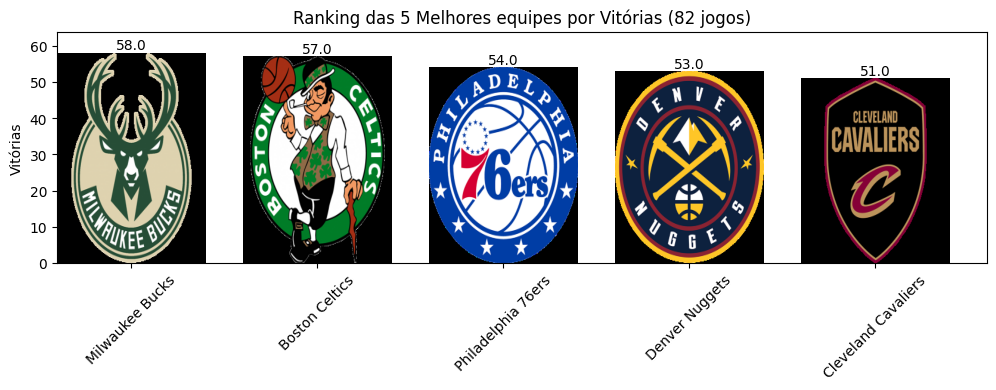

In [102]:
plotar_grafico_com_logos(top_5_vitorias, 'Vitórias', 'Ranking das 5 Melhores equipes por Vitórias (82 jogos)')

#### Vitórias em Casa

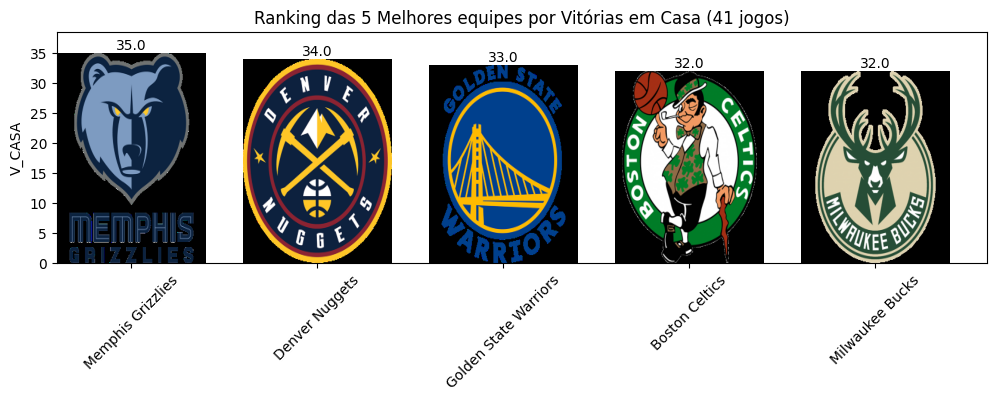

In [103]:
plotar_grafico_com_logos(dados_por_time_2023.sort("V_CASA", ascending=False).limit(5), 'V_CASA', 'Ranking das 5 Melhores equipes por Vitórias em Casa (41 jogos)')

#### Vitórias Fora de Casa

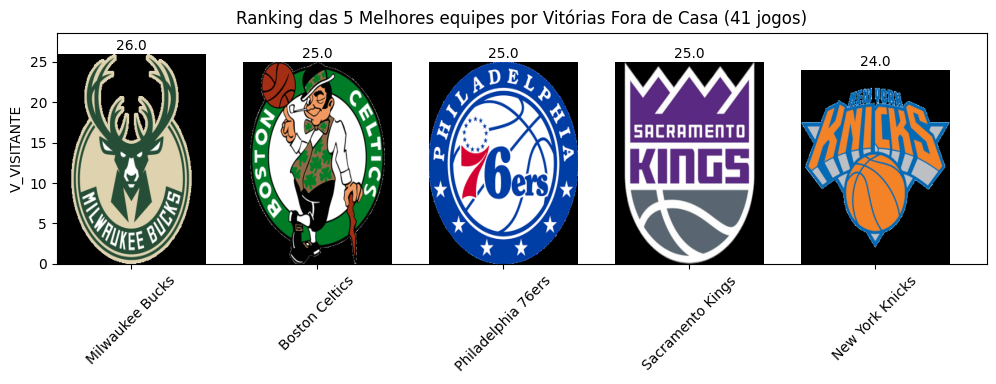

In [104]:
plotar_grafico_com_logos(dados_por_time_2023.sort("V_VISITANTE", ascending=False).limit(5), 'V_VISITANTE', 'Ranking das 5 Melhores equipes por Vitórias Fora de Casa (41 jogos)')

#### Vitórias contra times da mesma conferência

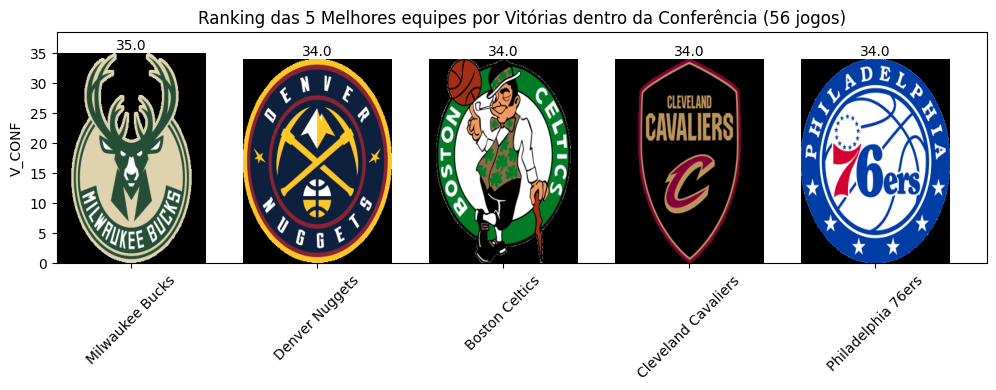

In [105]:
plotar_grafico_com_logos(dados_por_time_2023.sort("V_CONF", ascending=False).limit(5), 'V_CONF', 'Ranking das 5 Melhores equipes por Vitórias dentro da Conferência (56 jogos)')

### Derrotas

In [106]:
# Classificar o DataFrame por pontos em ordem decrescente (os melhores)
ranking_derrotas = dados_por_time_2023[['Time','D','CONFERÊNCIA']].sort("D", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_derrotas = ranking_derrotas.limit(5)
top_5_derrotas = top_5_derrotas.withColumnRenamed("D", "Derrotas")

top_5_derrotas.show()

+--------------------+--------+-----------+
|                Time|Derrotas|CONFERÊNCIA|
+--------------------+--------+-----------+
|     Detroit Pistons|      65|      LESTE|
|   San Antonio Spurs|      60|      OESTE|
|     Houston Rockets|      60|      OESTE|
|   Charlotte Hornets|      55|      LESTE|
|Portland Trail Bl...|      49|      OESTE|
+--------------------+--------+-----------+



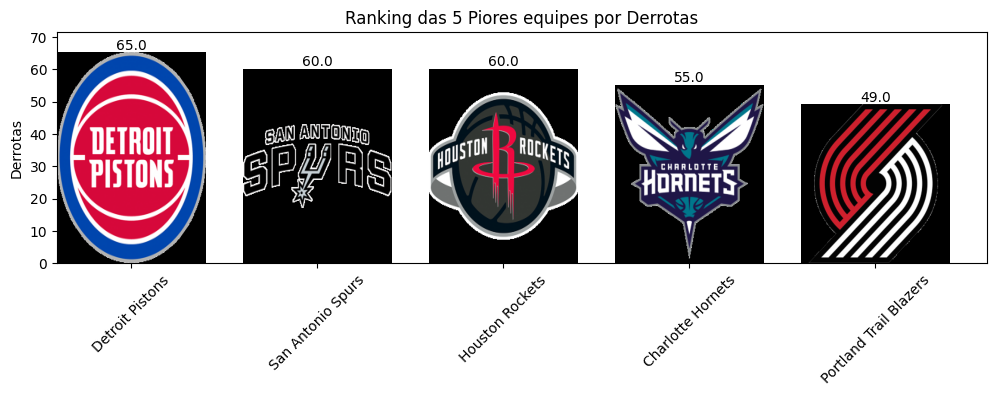

In [107]:
plotar_grafico_com_logos(top_5_derrotas, 'Derrotas', 'Ranking das 5 Piores equipes por Derrotas')

#### Derrotas em Casa

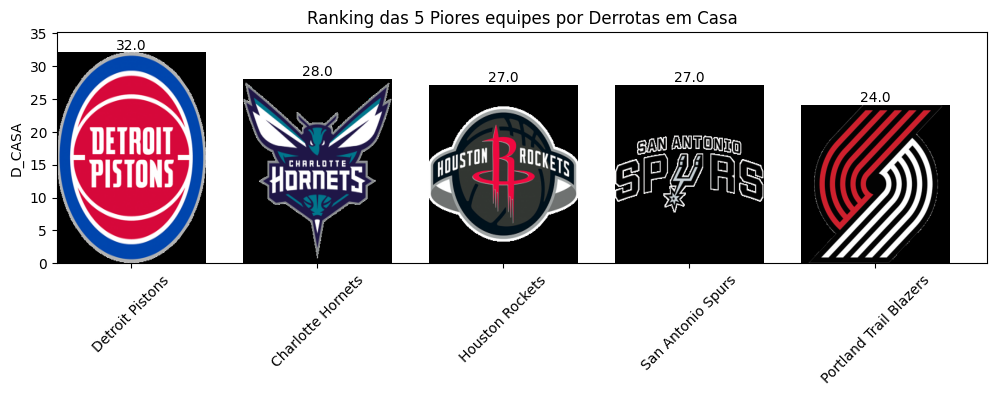

In [108]:
plotar_grafico_com_logos(dados_por_time_2023.sort("D_CASA", ascending=False).limit(5), "D_CASA", 'Ranking das 5 Piores equipes por Derrotas em Casa')

#### Derrotas fora de Casa

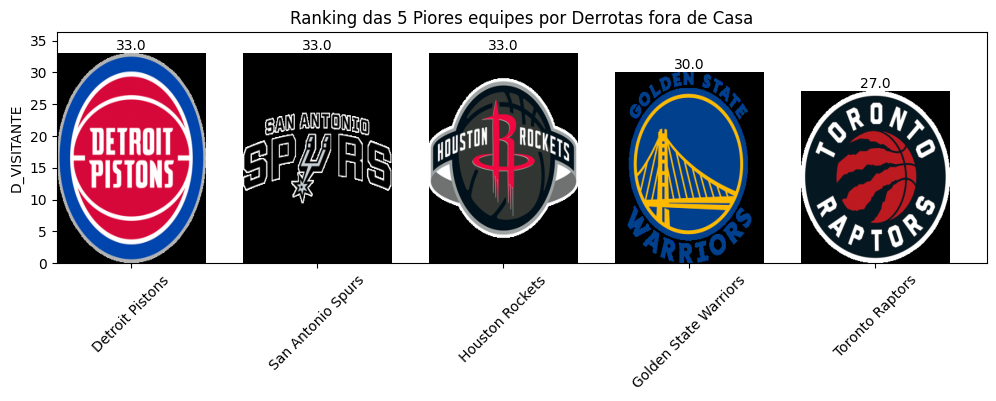

In [109]:
plotar_grafico_com_logos(dados_por_time_2023.sort("D_VISITANTE", ascending=False).limit(5), "D_VISITANTE", 'Ranking das 5 Piores equipes por Derrotas fora de Casa')

#### Derrotas para time da mesma Conferência

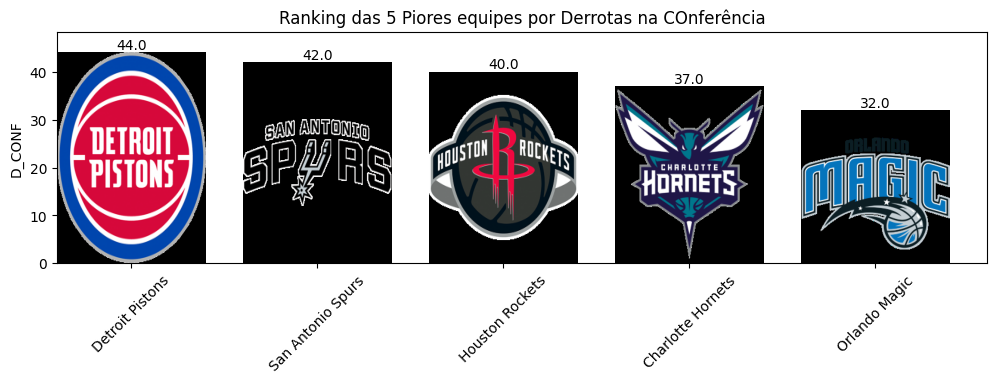

In [110]:
plotar_grafico_com_logos(
    dados_por_time_2023.sort(
        "D_CONF", ascending=False).limit(5), 
        "D_CONF", 
        'Ranking das 5 Piores equipes por Derrotas na COnferência'
)

### Ataque

#### Melhor Ataque

In [111]:
# Classificar o DataFrame por pontos em ordem decrescente (os melhores)
ranking_melhores_pts = dados_por_time_2023[['Time','PTS','CONFERÊNCIA']].sort("PTS", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_pts = ranking_melhores_pts.limit(5)
top_5_pts = top_5_pts.withColumnRenamed("PTS", "Pontos")

top_5_pts.show()

+--------------------+------+-----------+
|                Time|Pontos|CONFERÊNCIA|
+--------------------+------+-----------+
|    Sacramento Kings| 120.7|      OESTE|
|Golden State Warr...| 118.9|      OESTE|
|       Atlanta Hawks| 118.4|      LESTE|
|      Boston Celtics| 117.9|      LESTE|
|Oklahoma City Thu...| 117.5|      OESTE|
+--------------------+------+-----------+



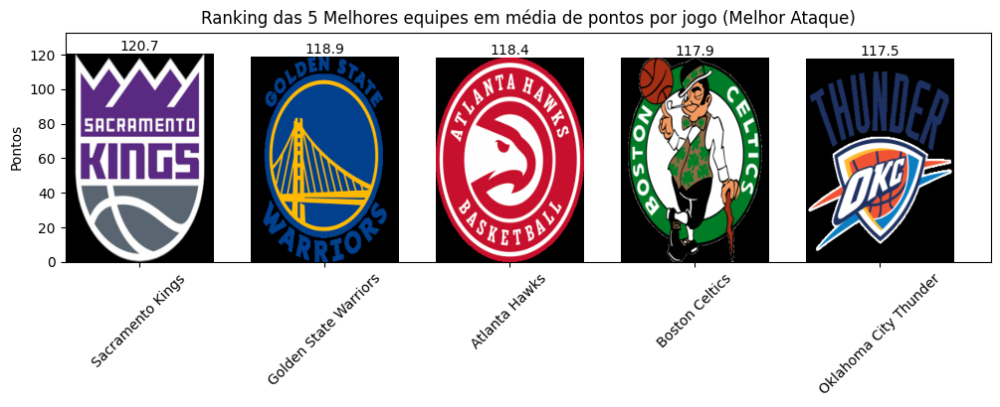

In [112]:
plotar_grafico_com_logos(top_5_pts, 'Pontos', 'Ranking das 5 Melhores equipes em média de pontos por jogo (Melhor Ataque)')

#### Pior Ataque

In [113]:
# Classificar o DataFrame por pontos em ordem crescente (os piores)
ranking_piores_pts = dados_por_time_2023[['Time','PTS','CONFERÊNCIA']].sort("PTS", ascending=True)

# Selecionar os 5 primeiros colocados
top_5_piores_pts = ranking_piores_pts.limit(5)
top_5_piores_pts = top_5_piores_pts.withColumnRenamed("PTS", "Pontos")

top_5_piores_pts.show()

+-----------------+------+-----------+
|             Time|Pontos|CONFERÊNCIA|
+-----------------+------+-----------+
|       Miami Heat| 109.5|      LESTE|
|  Detroit Pistons| 110.3|      LESTE|
|  Houston Rockets| 110.7|      OESTE|
|Charlotte Hornets| 111.0|      LESTE|
|    Orlando Magic| 111.4|      LESTE|
+-----------------+------+-----------+



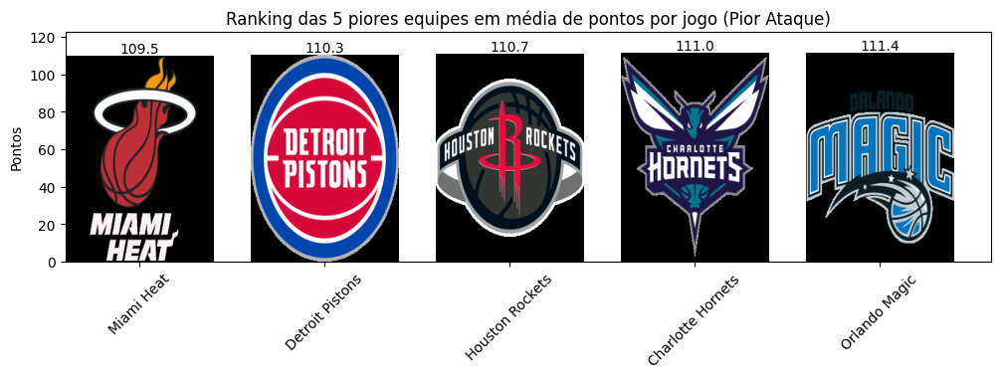

In [114]:
plotar_grafico_com_logos(top_5_piores_pts, 'Pontos', 'Ranking das 5 piores equipes em média de pontos por jogo (Pior Ataque)')

### Defesa

#### Melhor Defesa

In [115]:
# Classificar o DataFrame por pontos em ordem decrescente (os melhores)
ranking_melhores_def = dados_por_time_2023[['Time','PTS CONTRA','CONFERÊNCIA']].sort("PTS CONTRA", ascending=True)

# Selecionar os 5 primeiros colocados
top_5_melhores_def = ranking_melhores_def.limit(5)
top_5_melhores_def = top_5_melhores_def.withColumnRenamed("PTS CONTRA", "Pontos Contra")

top_5_melhores_def.show()

+-------------------+-------------+-----------+
|               Time|Pontos Contra|CONFERÊNCIA|
+-------------------+-------------+-----------+
|Cleveland Cavaliers|        106.9|      LESTE|
|         Miami Heat|        109.8|      LESTE|
| Philadelphia 76ers|        110.9|      LESTE|
|     Boston Celtics|        111.4|      LESTE|
|    Toronto Raptors|        111.4|      LESTE|
+-------------------+-------------+-----------+



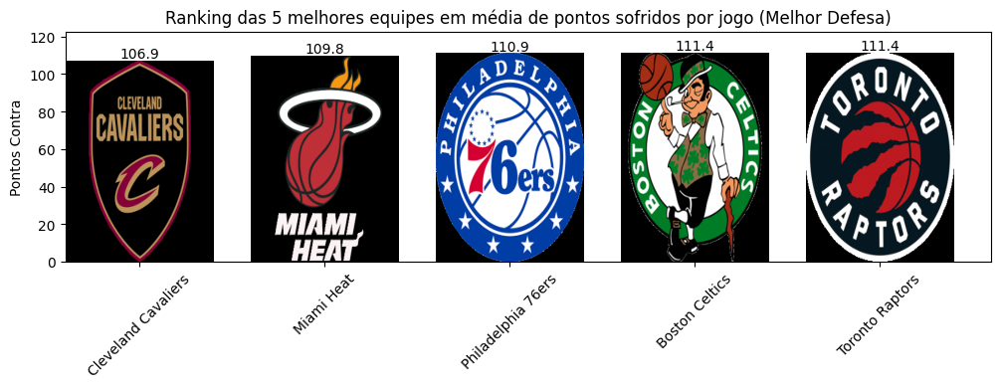

In [116]:
plotar_grafico_com_logos(top_5_melhores_def, 'Pontos Contra', 'Ranking das 5 melhores equipes em média de pontos sofridos por jogo (Melhor Defesa)')

#### Pior Defesa

In [117]:
# Classificar o DataFrame por pontos em ordem decrescente (os melhores)
ranking_piores_def = dados_por_time_2023[['Time','PTS CONTRA','CONFERÊNCIA']].sort("PTS CONTRA", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_piores_def = ranking_piores_def.limit(5)
top_5_piores_def = top_5_piores_def.withColumnRenamed("PTS CONTRA", "Pontos Contra")

top_5_piores_def.show()

+-----------------+-------------+-----------+
|             Time|Pontos Contra|CONFERÊNCIA|
+-----------------+-------------+-----------+
|San Antonio Spurs|        123.1|      OESTE|
|   Indiana Pacers|        119.5|      LESTE|
|  Houston Rockets|        118.6|      OESTE|
|  Detroit Pistons|        118.5|      LESTE|
|    Atlanta Hawks|        118.1|      LESTE|
+-----------------+-------------+-----------+



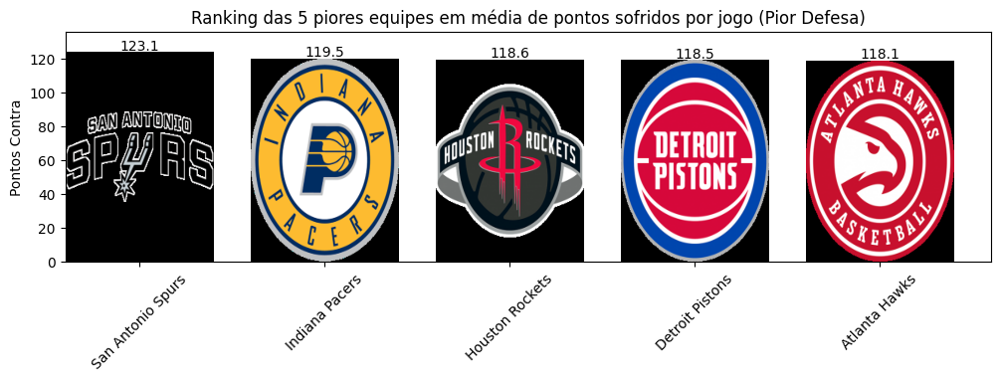

In [118]:
plotar_grafico_com_logos(top_5_piores_def, 'Pontos Contra', 'Ranking das 5 piores equipes em média de pontos sofridos por jogo (Pior Defesa)')

### Arremessos

#### Arremessos de quadra

In [254]:
# Classificar o DataFrame por pontos em ordem decrescente (os melhores)
ranking_arremessos = dados_por_time_2023[['Time', 'V', 'FG_PCT']].sort("FG_PCT", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_arremessos = ranking_arremessos.limit(5)
top_5_arremessos = top_5_arremessos.withColumn("FG_PCT", round(top_5_arremessos["FG_PCT"], 2))

# Renomeando as 3 colunas
top_5_arremessos = top_5_arremessos.withColumnRenamed("FG_PCT", "Arremessos de quadra %")

top_5_arremessos.show()

+--------------------+---+----------------------+
|                Time|  V|Arremessos de quadra %|
+--------------------+---+----------------------+
|    Sacramento Kings| 48|                 49.61|
|       Chicago Bulls| 40|                  49.3|
|Minnesota Timberw...| 42|                 49.11|
| Cleveland Cavaliers| 51|                 49.04|
|  Washington Wizards| 35|                 48.93|
+--------------------+---+----------------------+



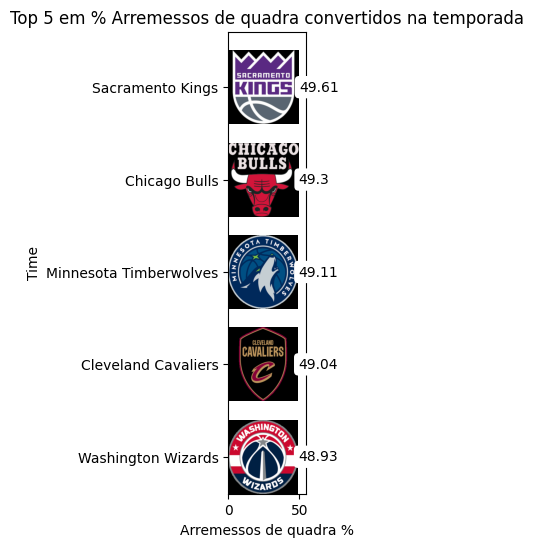

In [255]:
plotar_grafico_arremessos(top_5_arremessos.sort('Arremessos de quadra %', ascending=True), 'Arremessos de quadra %', 'Top 5 em % Arremessos de quadra convertidos na temporada')

#### Arremessos de 3 pontos

In [252]:
# Classificar o DataFrame por pontos em ordem decrescente (os melhores)
ranking_fg3 = dados_por_time_2023[['Time', 'V', 'FG3_PCT']].sort("FG3_PCT", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_fg3 = ranking_fg3.limit(5)
top_5_fg3 = top_5_fg3.withColumn("FG3_PCT", round(top_5_fg3["FG3_PCT"], 2))

# Renomeando as 3 colunas
top_5_fg3 = top_5_fg3.withColumnRenamed("FG3_PCT", "Arremessos de 3 pontos %")


top_5_fg3.show()

+--------------------+---+------------------------+
|                Time|  V|Arremessos de 3 pontos %|
+--------------------+---+------------------------+
|Golden State Warr...| 44|                   39.66|
|  Philadelphia 76ers| 54|                   38.65|
|       Brooklyn Nets| 45|                   38.44|
|Los Angeles Clippers| 44|                   38.08|
|      Denver Nuggets| 53|                   38.02|
+--------------------+---+------------------------+



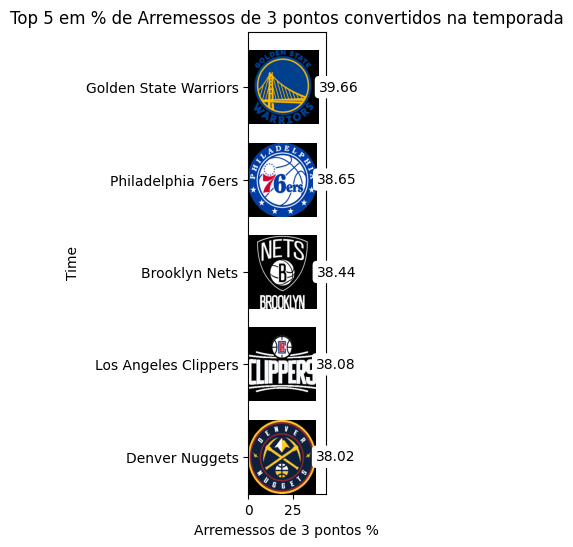

In [253]:
plotar_grafico_arremessos(top_5_fg3.sort("Arremessos de 3 pontos %", ascending=True), 'Arremessos de 3 pontos %', 'Top 5 em % de Arremessos de 3 pontos convertidos na temporada')

#### Lances Livres

In [243]:
# Classificar o DataFrame por pontos em ordem decrescente (os melhores)
ranking_ft = dados_por_time_2023[['Time', 'V', 'FT_PCT']].sort("FT_PCT", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_ft = ranking_ft.limit(5)
top_5_ft = top_5_ft.withColumn("FT_PCT", round(top_5_ft["FT_PCT"], 2))

# Renomeando as 3 colunas
top_5_ft = top_5_ft.withColumnRenamed("FT_PCT", "Lances Livres %")


top_5_ft.show()

+------------------+---+---------------+
|              Time|  V|Lances Livres %|
+------------------+---+---------------+
|     Brooklyn Nets| 45|          84.62|
|Philadelphia 76ers| 54|          83.67|
|     Atlanta Hawks| 41|          82.84|
|        Miami Heat| 44|          82.72|
|    Boston Celtics| 57|          81.31|
+------------------+---+---------------+



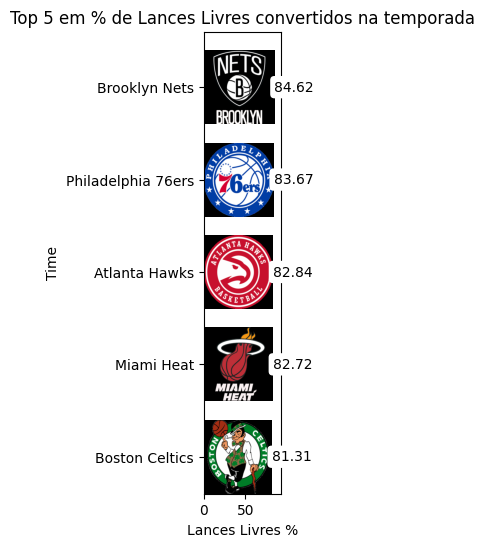

In [251]:
plotar_grafico_arremessos(top_5_ft.sort("Lances Livres %", ascending=True), 'Lances Livres %', 'Top 5 em % de Lances Livres convertidos na temporada')

### Assistências

In [119]:
# Classificar o DataFrame por assistências em ordem decrescente (os melhores)
ranking_melhores_ast = dados_por_time_2023[['Time','AST','CONFERÊNCIA']].sort("AST", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_ast = ranking_melhores_ast.limit(5)
top_5_ast = top_5_ast.withColumnRenamed("AST", "Assistências")

top_5_ast.show()

+--------------------+------------+-----------+
|                Time|Assistências|CONFERÊNCIA|
+--------------------+------------+-----------+
|      Indiana Pacers|        26.7|      LESTE|
|   Memphis Grizzlies|        26.0|      OESTE|
|      Boston Celtics|        25.8|      LESTE|
|Golden State Warr...|        25.2|      OESTE|
|  Philadelphia 76ers|        25.2|      LESTE|
+--------------------+------------+-----------+



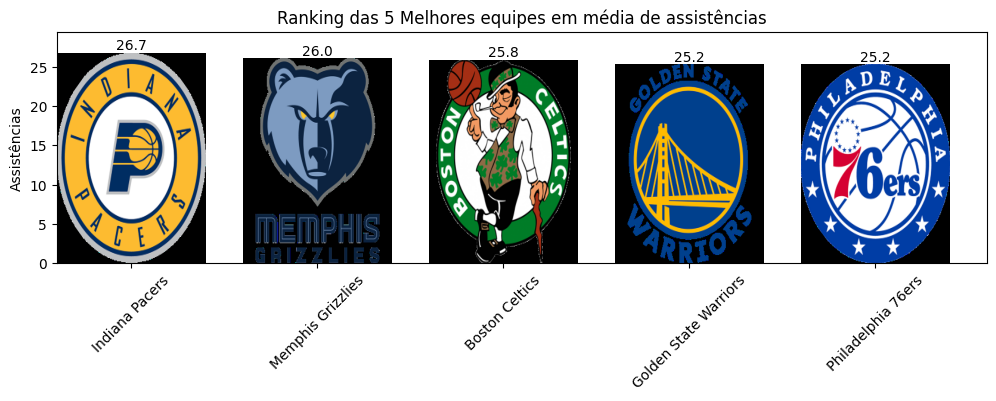

In [216]:
plotar_grafico_com_logos(top_5_ast, 'Assistências', 'Ranking das 5 Melhores equipes em média de assistências')

### Rebotes

In [121]:
# Classificar o DataFrame por assistências em ordem decrescente (os melhores)
ranking_melhores_reb = dados_por_time_2023[['Time','REB', 'DREB', 'OREB', 'CONFERÊNCIA']].sort("REB", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_reb = ranking_melhores_reb.limit(5)
top_5_reb = top_5_reb.withColumnRenamed("REB", "Rebotes").withColumnRenamed("DREB", "Rebotes Defensivos").withColumnRenamed("OREB", "Rebotes Ofensivos")

top_5_reb.show()

+--------------------+-------+------------------+-----------------+-----------+
|                Time|Rebotes|Rebotes Defensivos|Rebotes Ofensivos|CONFERÊNCIA|
+--------------------+-------+------------------+-----------------+-----------+
|   Memphis Grizzlies|   46.6|              34.5|             12.0|      OESTE|
|     Milwaukee Bucks|   45.2|              34.6|             10.5|      LESTE|
|      Boston Celtics|   42.8|              33.6|              9.3|      LESTE|
|Oklahoma City Thu...|   41.7|              30.8|             10.8|      OESTE|
|Golden State Warr...|   41.5|              31.5|             10.0|      OESTE|
+--------------------+-------+------------------+-----------------+-----------+



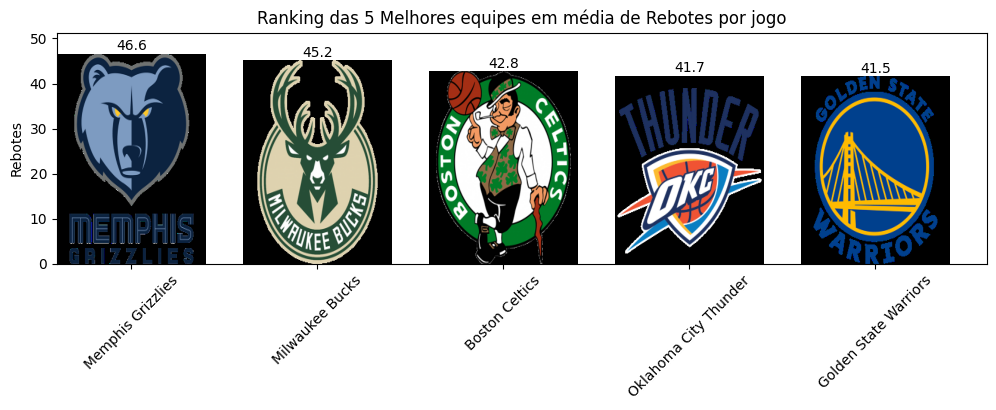

In [122]:
plotar_grafico_com_logos(top_5_reb, 'Rebotes', 'Ranking das 5 Melhores equipes em média de Rebotes por jogo')

#### Rebotes Defensivos

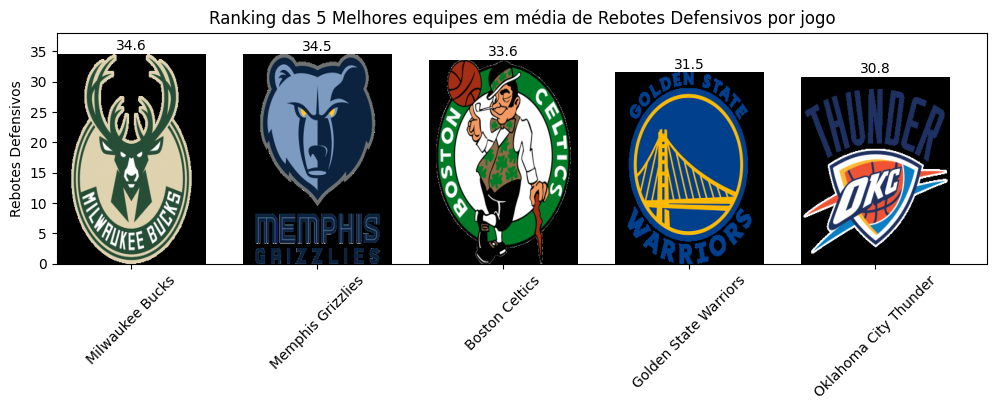

In [123]:
plotar_grafico_com_logos(top_5_reb.sort("Rebotes Defensivos", ascending=False), 'Rebotes Defensivos', 'Ranking das 5 Melhores equipes em média de Rebotes Defensivos por jogo')

#### Rebotes Ofensivos

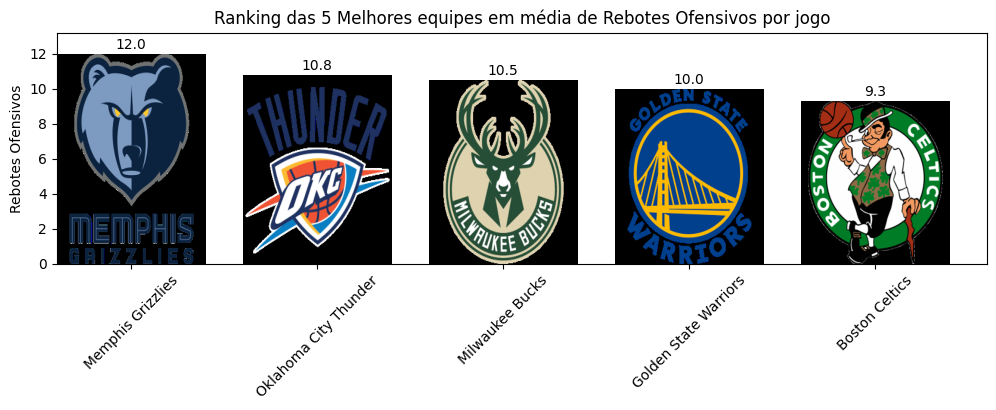

In [124]:
plotar_grafico_com_logos(top_5_reb.sort("Rebotes Ofensivos", ascending=False), 'Rebotes Ofensivos', 'Ranking das 5 Melhores equipes em média de Rebotes Ofensivos por jogo')

### Tocos

In [125]:
# Classificar o DataFrame por assistências em ordem decrescente (os melhores)
ranking_melhores_blk = dados_por_time_2023[['Time','BLK','CONFERÊNCIA']].sort("BLK", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_blk = ranking_melhores_blk.limit(5)
top_5_blk = top_5_blk.withColumnRenamed("BLK", "Tocos")

top_5_blk.show()

+--------------------+-----+-----------+
|                Time|Tocos|CONFERÊNCIA|
+--------------------+-----+-----------+
|   Memphis Grizzlies|  5.8|      OESTE|
|      Indiana Pacers|  5.8|      LESTE|
|Minnesota Timberw...|  5.4|      OESTE|
|      Boston Celtics|  5.0|      LESTE|
|  Washington Wizards|  4.8|      LESTE|
+--------------------+-----+-----------+



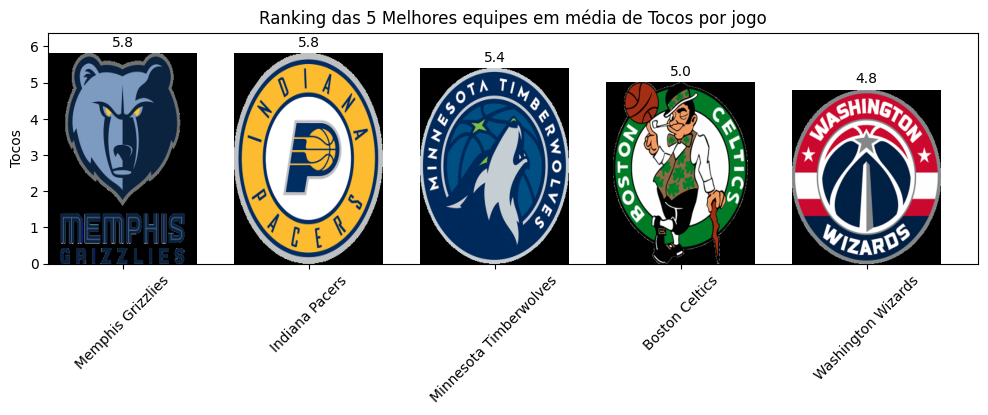

In [126]:
plotar_grafico_com_logos(top_5_blk, 'Tocos', 'Ranking das 5 Melhores equipes em média de Tocos por jogo')

### Roubos de bola

In [127]:
# Classificar o DataFrame por assistências em ordem decrescente (os melhores)
ranking_melhores_stl = dados_por_time_2023[['Time','STL','CONFERÊNCIA']].sort("STL", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_stl = ranking_melhores_stl.limit(5)
top_5_stl = top_5_stl.withColumnRenamed("STL", "Roubos de bola")

top_5_stl.show()

+--------------------+--------------+-----------+
|                Time|Roubos de bola|CONFERÊNCIA|
+--------------------+--------------+-----------+
|   Memphis Grizzlies|           8.3|      OESTE|
|Oklahoma City Thu...|           7.9|      OESTE|
|     Toronto Raptors|           7.8|      LESTE|
|Minnesota Timberw...|           7.7|      OESTE|
|  Philadelphia 76ers|           7.7|      LESTE|
+--------------------+--------------+-----------+



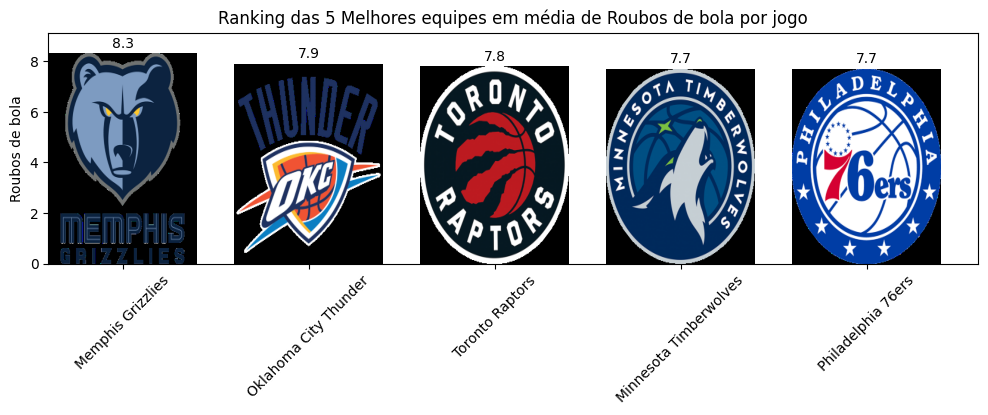

In [128]:
plotar_grafico_com_logos(top_5_stl, 'Roubos de bola', 'Ranking das 5 Melhores equipes em média de Roubos de bola por jogo')

### Perda de posse (Turnover)

In [129]:
# Classificar o DataFrame por assistências em ordem decrescente (os melhores)
ranking_melhores_tov = dados_por_time_2023[['Time','TOV','CONFERÊNCIA']].sort("TOV", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_tov = ranking_melhores_tov.limit(5)
top_5_tov = top_5_tov.withColumnRenamed("TOV", "Perda de posse (Turnover)")

top_5_tov.show()

+--------------------+-------------------------+-----------+
|                Time|Perda de posse (Turnover)|CONFERÊNCIA|
+--------------------+-------------------------+-----------+
|Minnesota Timberw...|                     14.4|      OESTE|
|      Indiana Pacers|                     14.0|      LESTE|
|     Milwaukee Bucks|                     13.5|      LESTE|
|   Memphis Grizzlies|                     12.9|      OESTE|
|  Philadelphia 76ers|                     12.8|      LESTE|
+--------------------+-------------------------+-----------+



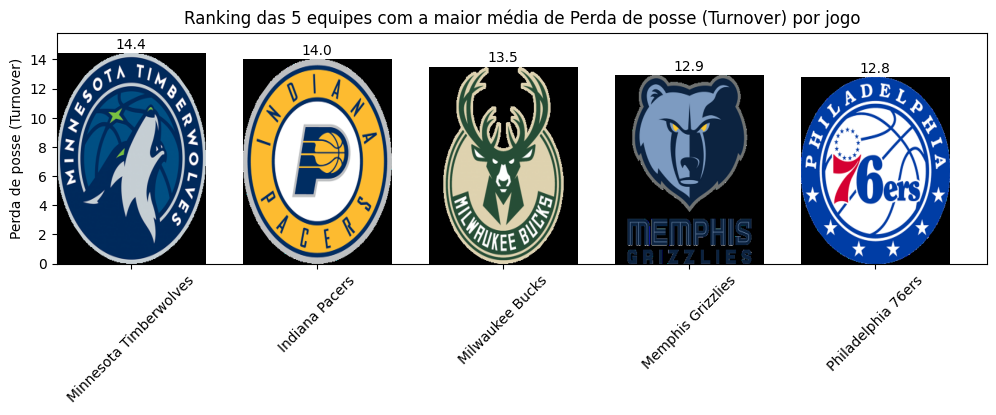

In [130]:
plotar_grafico_com_logos(top_5_tov, 'Perda de posse (Turnover)', 'Ranking das 5 equipes com a maior média de Perda de posse (Turnover) por jogo')

### Faltas coletivas

In [131]:
# Classificar o DataFrame por assistências em ordem decrescente (os melhores)
ranking_melhores_pf = dados_por_time_2023[['Time','PF','CONFERÊNCIA']].sort("PF", ascending=False)

# Selecionar os 5 primeiros colocados
top_5_pf = ranking_melhores_pf.limit(5)
top_5_pf = top_5_pf.withColumnRenamed("PF", "Faltas Coletivas")

top_5_pf.show()

+--------------------+----------------+-----------+
|                Time|Faltas Coletivas|CONFERÊNCIA|
+--------------------+----------------+-----------+
|Minnesota Timberw...|            21.0|      OESTE|
|      Indiana Pacers|            20.8|      LESTE|
|  Philadelphia 76ers|            20.4|      LESTE|
|Oklahoma City Thu...|            20.2|      OESTE|
|   Memphis Grizzlies|            20.0|      OESTE|
+--------------------+----------------+-----------+



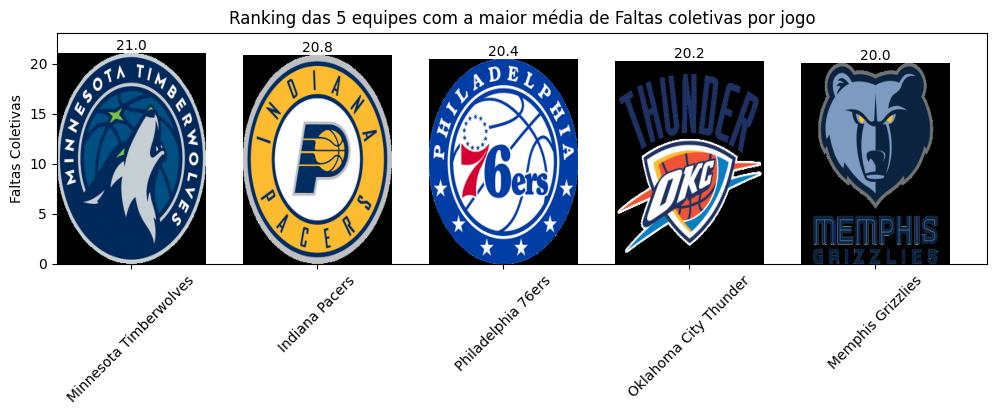

In [132]:
plotar_grafico_com_logos(top_5_pf, 'Faltas Coletivas', 'Ranking das 5 equipes com a maior média de Faltas coletivas por jogo')

## Conferências

### Conferência Leste - Classificação pelos principais quesitos (vitórias, Ataque, Defesa, Assistências e Rebotes

#### Vitórias

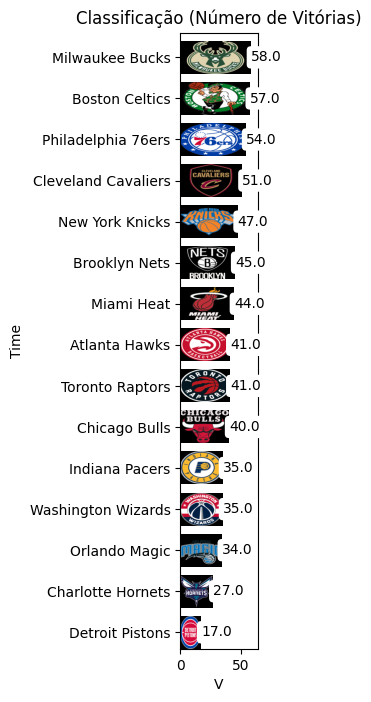

In [133]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("V", ascending=True), "V", "LESTE", "Classificação (Número de Vitórias)")

#### Ataque

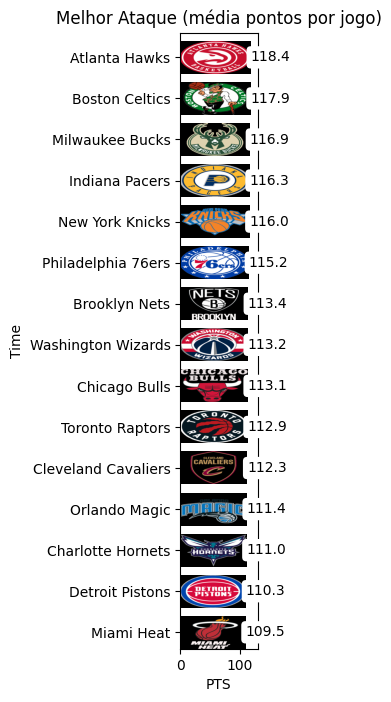

In [134]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("PTS", ascending=True), "PTS", "LESTE", "Melhor Ataque (média pontos por jogo)")

#### Defesa

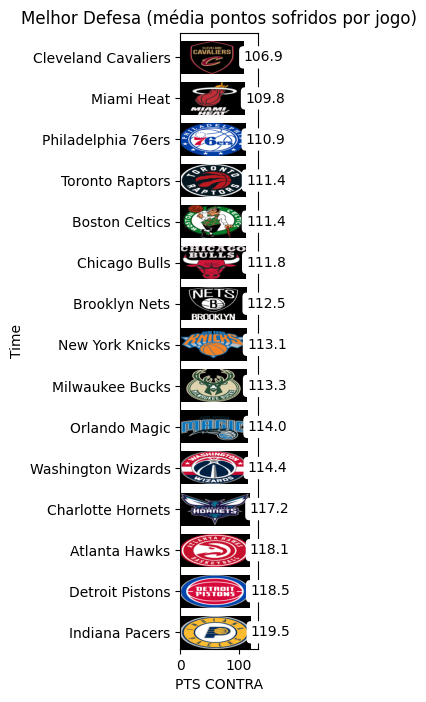

In [135]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("PTS CONTRA", ascending=False), "PTS CONTRA", "LESTE", "Melhor Defesa (média pontos sofridos por jogo)")

#### Assistências

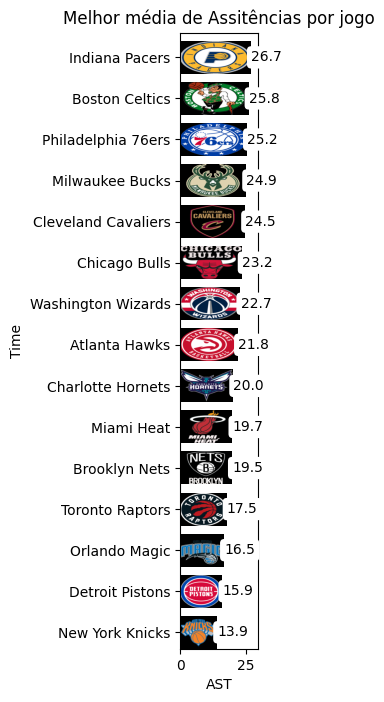

In [136]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("AST", ascending=True), "AST", "LESTE", "Melhor média de Assitências por jogo")

#### Rebotes

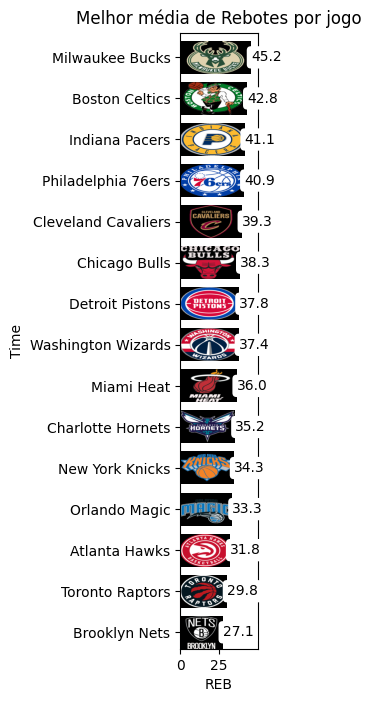

In [137]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("REB", ascending=True), "REB", "LESTE", "Melhor média de Rebotes por jogo")

### Conferência Oeste - Classificação pelos principais quesitos (vitórias, Ataque, Defesa, Assistências e Rebotes

#### Vitórias

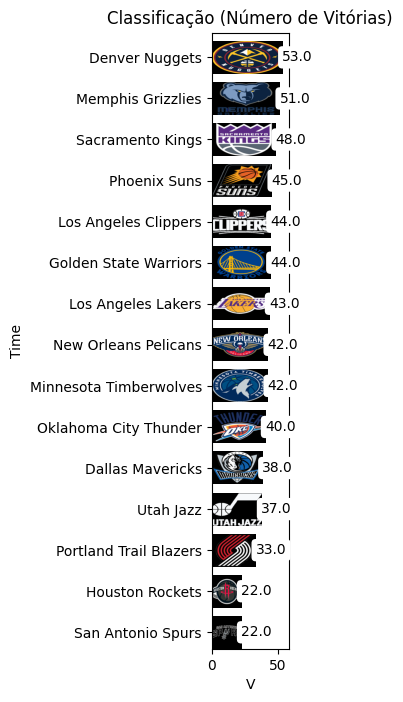

In [138]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("V", ascending=True), "V", "OESTE", "Classificação (Número de Vitórias)")

#### Ataque

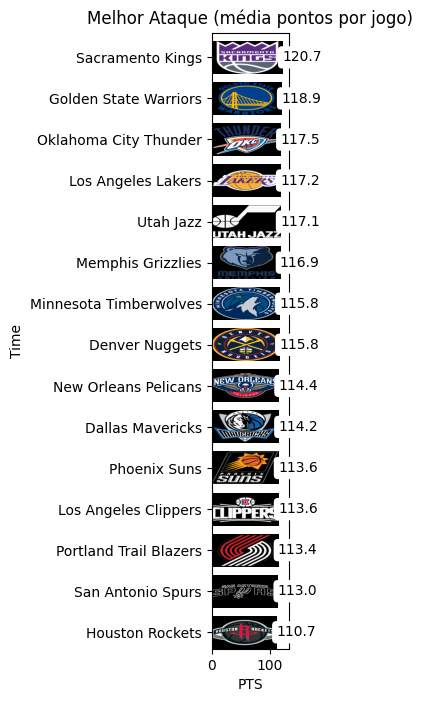

In [139]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("PTS", ascending=True), "PTS", "OESTE", "Melhor Ataque (média pontos por jogo)")

#### Defesa

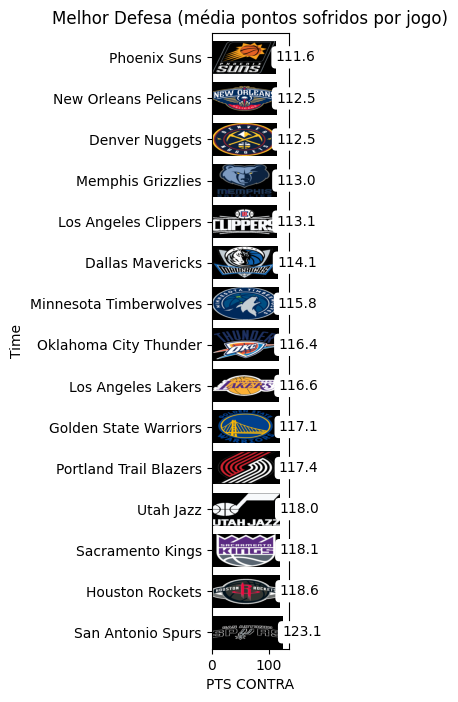

In [140]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("PTS CONTRA", ascending=False), "PTS CONTRA", "OESTE", "Melhor Defesa (média pontos sofridos por jogo)")

#### Assistências

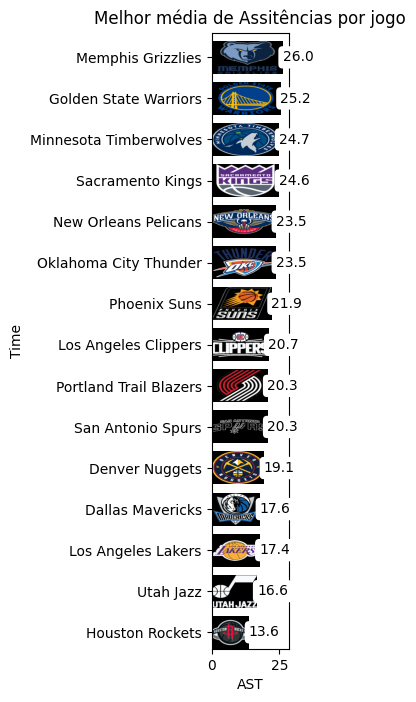

In [141]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("AST", ascending=True), "AST", "OESTE", "Melhor média de Assitências por jogo")

#### Rebotes

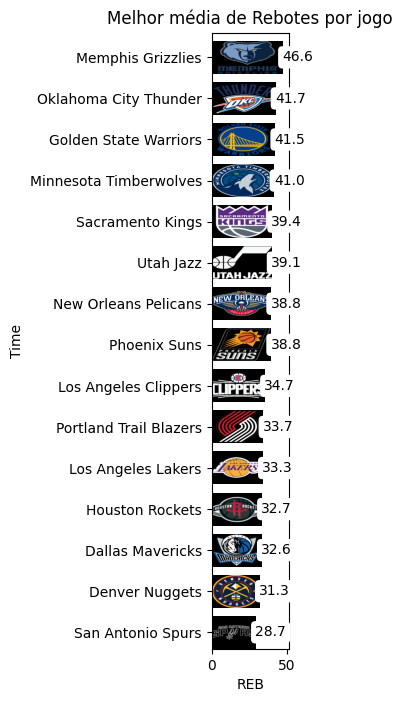

In [142]:
plotar_grafico_barras_horizontais(dados_por_time_2023.sort("REB", ascending=True), "REB", "OESTE", "Melhor média de Rebotes por jogo")

## Principais estatísticas por time (Vitórias | Pontos | Assistências | Rebotes | Tocos | Roubos de bola)

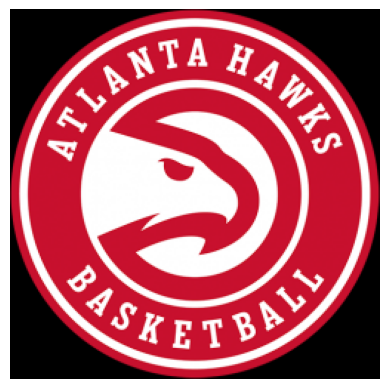

+-------------+--------+------+------------+-------+-----+--------------+
|         Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+-------------+--------+------+------------+-------+-----+--------------+
|Atlanta Hawks|      41| 118.4|        21.8|   31.8|  3.4|           5.7|
+-------------+--------+------+------------+-------+-----+--------------+



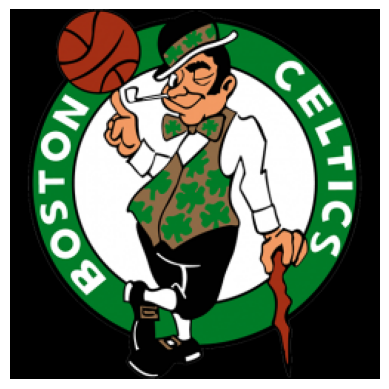

+--------------+--------+------+------------+-------+-----+--------------+
|          Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+--------------+--------+------+------------+-------+-----+--------------+
|Boston Celtics|      57| 117.9|        25.8|   42.8|  5.0|           6.0|
+--------------+--------+------+------------+-------+-----+--------------+



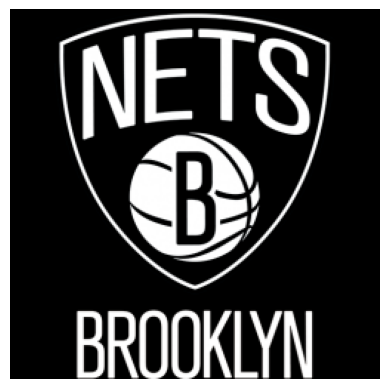

+-------------+--------+------+------------+-------+-----+--------------+
|         Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+-------------+--------+------+------------+-------+-----+--------------+
|Brooklyn Nets|      45| 113.4|        19.5|   27.1|  3.2|           5.4|
+-------------+--------+------+------------+-------+-----+--------------+



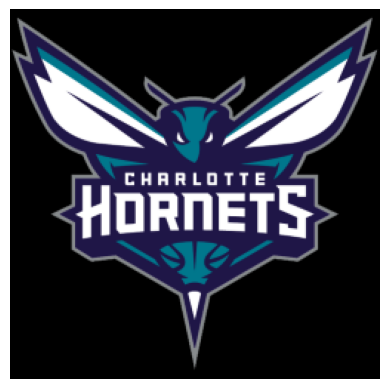

+-----------------+--------+------+------------+-------+-----+--------------+
|             Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+-----------------+--------+------+------------+-------+-----+--------------+
|Charlotte Hornets|      27| 111.0|        20.0|   35.2|  4.6|           6.8|
+-----------------+--------+------+------------+-------+-----+--------------+



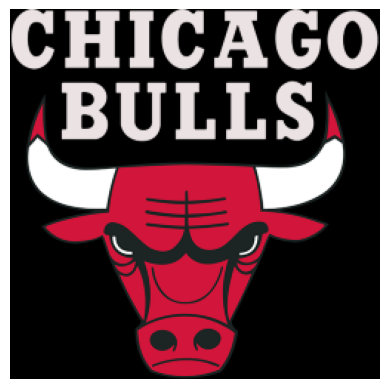

+-------------+--------+------+------------+-------+-----+--------------+
|         Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+-------------+--------+------+------------+-------+-----+--------------+
|Chicago Bulls|      40| 113.1|        23.2|   38.3|  3.7|           7.0|
+-------------+--------+------+------------+-------+-----+--------------+



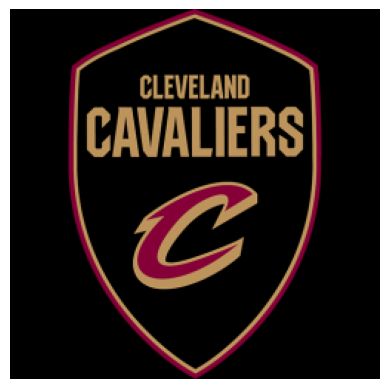

+-------------------+--------+------+------------+-------+-----+--------------+
|               Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+-------------------+--------+------+------------+-------+-----+--------------+
|Cleveland Cavaliers|      51| 112.3|        24.5|   39.3|  4.4|           6.8|
+-------------------+--------+------+------------+-------+-----+--------------+



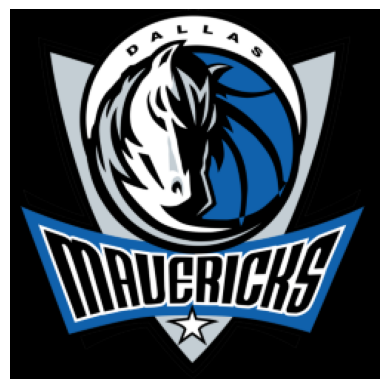

+----------------+--------+------+------------+-------+-----+--------------+
|            Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+----------------+--------+------+------------+-------+-----+--------------+
|Dallas Mavericks|      38| 114.2|        17.6|   32.6|  3.3|           5.1|
+----------------+--------+------+------------+-------+-----+--------------+



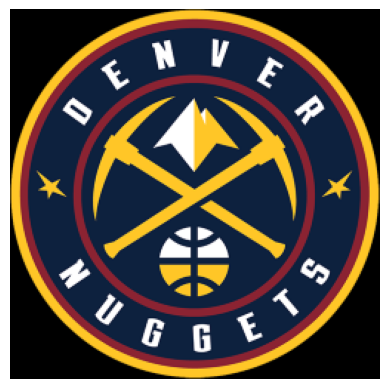

+--------------+--------+------+------------+-------+-----+--------------+
|          Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+--------------+--------+------+------------+-------+-----+--------------+
|Denver Nuggets|      53| 115.8|        19.1|   31.3|  3.7|           6.1|
+--------------+--------+------+------------+-------+-----+--------------+



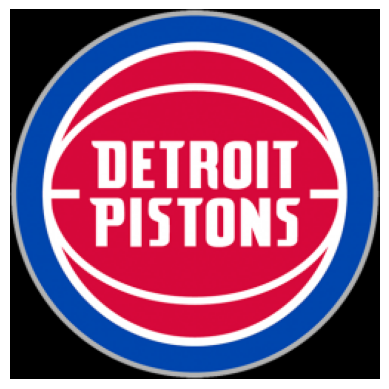

+---------------+--------+------+------------+-------+-----+--------------+
|           Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+---------------+--------+------+------------+-------+-----+--------------+
|Detroit Pistons|      17| 110.3|        15.9|   37.8|  3.3|           5.3|
+---------------+--------+------+------------+-------+-----+--------------+



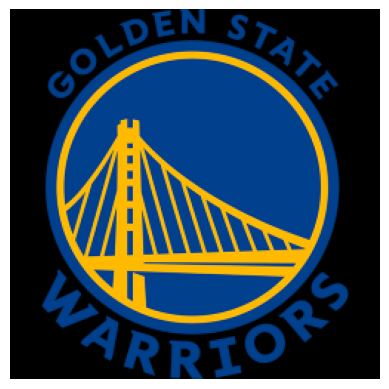

+--------------------+--------+------+------------+-------+-----+--------------+
|                Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+--------------------+--------+------+------------+-------+-----+--------------+
|Golden State Warr...|      44| 118.9|        25.2|   41.5|  3.6|           6.3|
+--------------------+--------+------+------------+-------+-----+--------------+



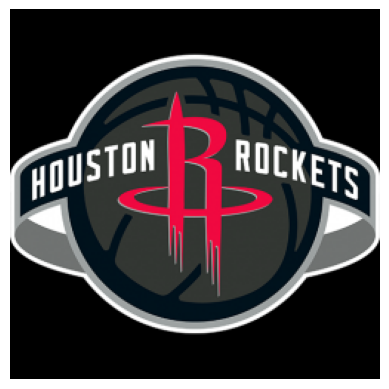

+---------------+--------+------+------------+-------+-----+--------------+
|           Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+---------------+--------+------+------------+-------+-----+--------------+
|Houston Rockets|      22| 110.7|        13.6|   32.7|  3.4|           5.2|
+---------------+--------+------+------------+-------+-----+--------------+



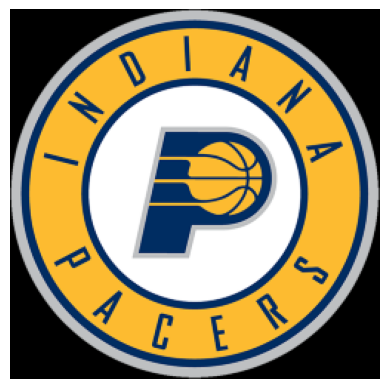

+--------------+--------+------+------------+-------+-----+--------------+
|          Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+--------------+--------+------+------------+-------+-----+--------------+
|Indiana Pacers|      35| 116.3|        26.7|   41.1|  5.8|           7.6|
+--------------+--------+------+------------+-------+-----+--------------+



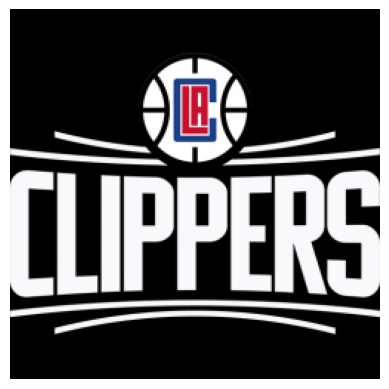

+--------------------+--------+------+------------+-------+-----+--------------+
|                Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+--------------------+--------+------+------------+-------+-----+--------------+
|Los Angeles Clippers|      44| 113.6|        20.7|   34.7|  3.5|           6.0|
+--------------------+--------+------+------------+-------+-----+--------------+



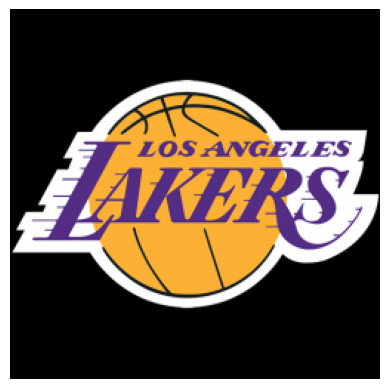

+------------------+--------+------+------------+-------+-----+--------------+
|              Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+------------------+--------+------+------------+-------+-----+--------------+
|Los Angeles Lakers|      43| 117.2|        17.4|   33.3|  3.6|           4.4|
+------------------+--------+------+------------+-------+-----+--------------+



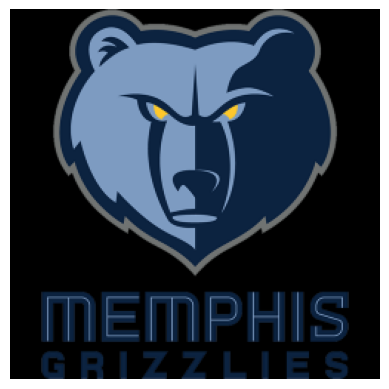

+-----------------+--------+------+------------+-------+-----+--------------+
|             Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+-----------------+--------+------+------------+-------+-----+--------------+
|Memphis Grizzlies|      51| 116.9|        26.0|   46.6|  5.8|           8.3|
+-----------------+--------+------+------------+-------+-----+--------------+



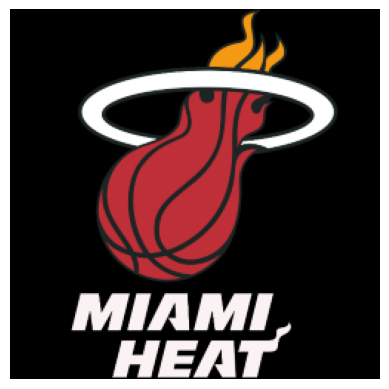

+----------+--------+------+------------+-------+-----+--------------+
|      Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+----------+--------+------+------------+-------+-----+--------------+
|Miami Heat|      44| 109.5|        19.7|   36.0|  2.7|           6.6|
+----------+--------+------+------------+-------+-----+--------------+



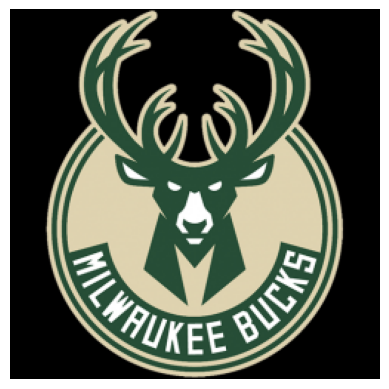

+---------------+--------+------+------------+-------+-----+--------------+
|           Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+---------------+--------+------+------------+-------+-----+--------------+
|Milwaukee Bucks|      58| 116.9|        24.9|   45.2|  4.8|           5.9|
+---------------+--------+------+------------+-------+-----+--------------+



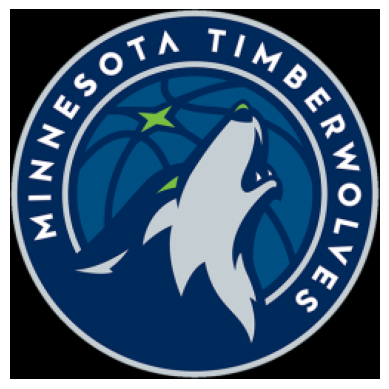

+--------------------+--------+------+------------+-------+-----+--------------+
|                Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+--------------------+--------+------+------------+-------+-----+--------------+
|Minnesota Timberw...|      42| 115.8|        24.7|   41.0|  5.4|           7.7|
+--------------------+--------+------+------------+-------+-----+--------------+



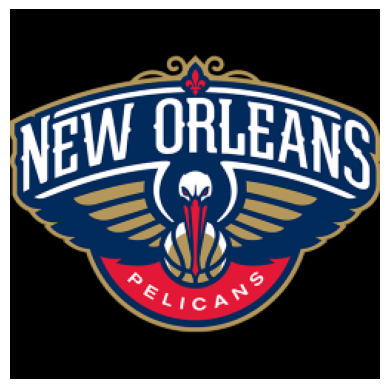

+--------------------+--------+------+------------+-------+-----+--------------+
|                Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+--------------------+--------+------+------------+-------+-----+--------------+
|New Orleans Pelicans|      42| 114.4|        23.5|   38.8|  3.4|           6.8|
+--------------------+--------+------+------------+-------+-----+--------------+



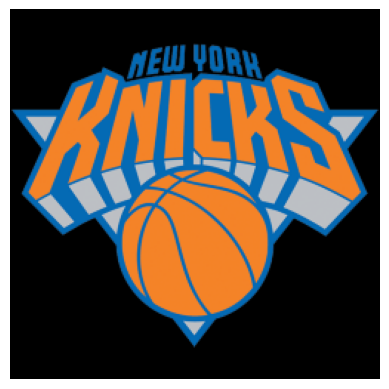

+---------------+--------+------+------------+-------+-----+--------------+
|           Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+---------------+--------+------+------------+-------+-----+--------------+
|New York Knicks|      47| 116.0|        13.9|   34.3|  3.7|           5.1|
+---------------+--------+------+------------+-------+-----+--------------+



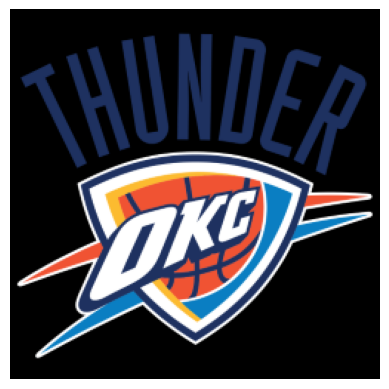

+--------------------+--------+------+------------+-------+-----+--------------+
|                Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+--------------------+--------+------+------------+-------+-----+--------------+
|Oklahoma City Thu...|      40| 117.5|        23.5|   41.7|  3.6|           7.9|
+--------------------+--------+------+------------+-------+-----+--------------+



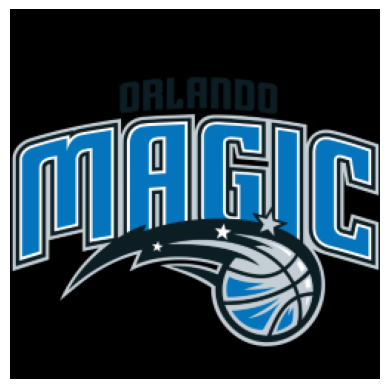

+-------------+--------+------+------------+-------+-----+--------------+
|         Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+-------------+--------+------+------------+-------+-----+--------------+
|Orlando Magic|      34| 111.4|        16.5|   33.3|  3.9|           5.0|
+-------------+--------+------+------------+-------+-----+--------------+



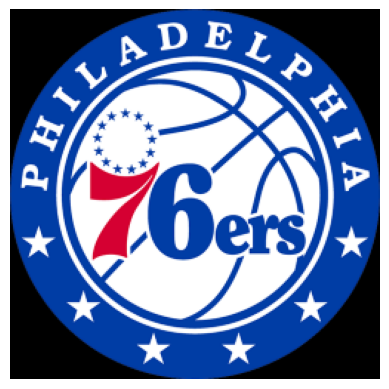

+------------------+--------+------+------------+-------+-----+--------------+
|              Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+------------------+--------+------+------------+-------+-----+--------------+
|Philadelphia 76ers|      54| 115.2|        25.2|   40.9|  4.7|           7.7|
+------------------+--------+------+------------+-------+-----+--------------+



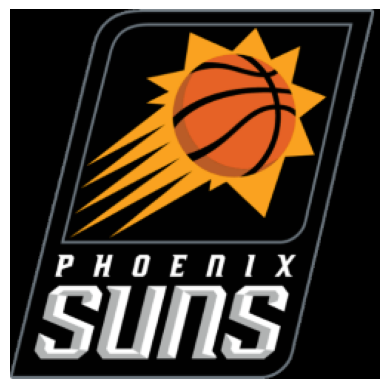

+------------+--------+------+------------+-------+-----+--------------+
|        Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+------------+--------+------+------------+-------+-----+--------------+
|Phoenix Suns|      45| 113.6|        21.9|   38.8|  4.7|           5.7|
+------------+--------+------+------------+-------+-----+--------------+



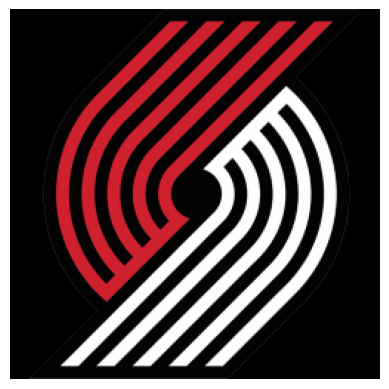

+--------------------+--------+------+------------+-------+-----+--------------+
|                Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+--------------------+--------+------+------------+-------+-----+--------------+
|Portland Trail Bl...|      33| 113.4|        20.3|   33.7|  3.7|           5.3|
+--------------------+--------+------+------------+-------+-----+--------------+



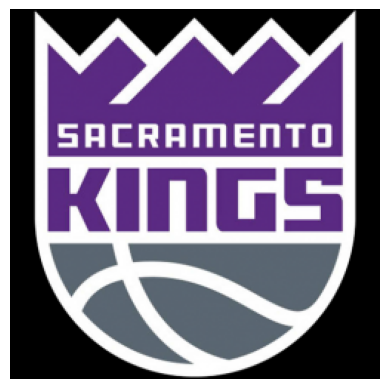

+----------------+--------+------+------------+-------+-----+--------------+
|            Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+----------------+--------+------+------------+-------+-----+--------------+
|Sacramento Kings|      48| 120.7|        24.6|   39.4|  3.1|           6.0|
+----------------+--------+------+------------+-------+-----+--------------+



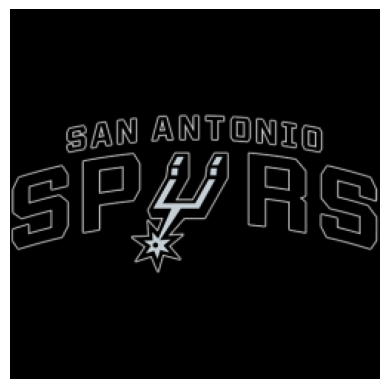

+-----------------+--------+------+------------+-------+-----+--------------+
|             Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+-----------------+--------+------+------------+-------+-----+--------------+
|San Antonio Spurs|      22| 113.0|        20.3|   28.7|  2.5|           5.3|
+-----------------+--------+------+------------+-------+-----+--------------+



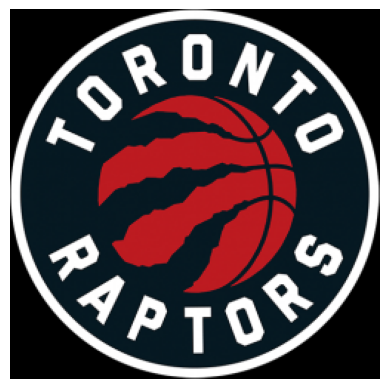

+---------------+--------+------+------------+-------+-----+--------------+
|           Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+---------------+--------+------+------------+-------+-----+--------------+
|Toronto Raptors|      41| 112.9|        17.5|   29.8|  3.5|           7.8|
+---------------+--------+------+------------+-------+-----+--------------+



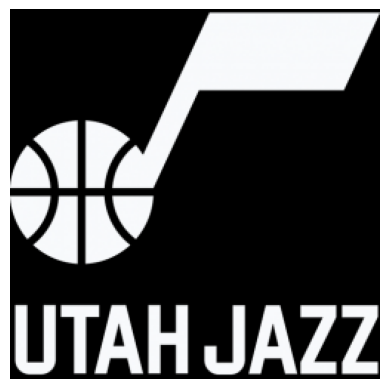

+---------+--------+------+------------+-------+-----+--------------+
|     Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+---------+--------+------+------------+-------+-----+--------------+
|Utah Jazz|      37| 117.1|        16.6|   39.1|  4.7|           4.7|
+---------+--------+------+------------+-------+-----+--------------+



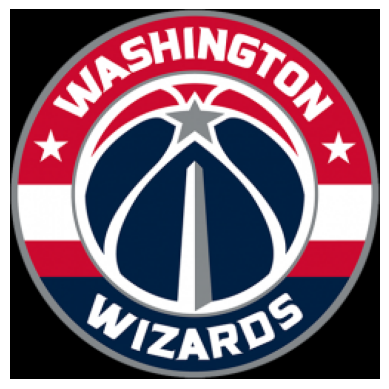

+------------------+--------+------+------------+-------+-----+--------------+
|              Time|Vitórias|Pontos|Assistências|Rebotes|Tocos|Roubos de bola|
+------------------+--------+------+------------+-------+-----+--------------+
|Washington Wizards|      35| 113.2|        22.7|   37.4|  4.8|           6.0|
+------------------+--------+------+------------+-------+-----+--------------+



In [143]:
# Criando a visualização dos dados por time em ordem alfabética
for time in lista_times_nba:
  mostrar_estatisticas(time)